# Project Phase 1 - CSE 515

## Import required libraries and dataset

In [1]:
import os
import cv2
from torchvision.models import resnet50
from torchvision.datasets import Caltech101
import pandas as pd
import numpy as np
import torch
import torchvision.transforms as transforms
from scipy.stats import moment
from PIL import Image
import warnings
warnings.filterwarnings("ignore")
from scipy.spatial.distance import cosine
from tqdm.notebook import tqdm
from scipy.stats import skew
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.metrics.pairwise import cosine_similarity
from ipywidgets import interact, widgets
from IPython.display import display, Markdown, HTML
from IPython.display import clear_output

In [2]:
caltech101 = Caltech101("~/CSE 515 - Multimedia Web Databases/",download=True)

131740031it [00:07, 18814734.28it/s]


Extracting /home/kesudh/CSE 515 - Multimedia Web Databases/caltech101/101_ObjectCategories.tar.gz to /home/kesudh/CSE 515 - Multimedia Web Databases/caltech101


14028800it [00:01, 13544276.83it/s]


Extracting /home/kesudh/CSE 515 - Multimedia Web Databases/caltech101/Annotations.tar to /home/kesudh/CSE 515 - Multimedia Web Databases/caltech101


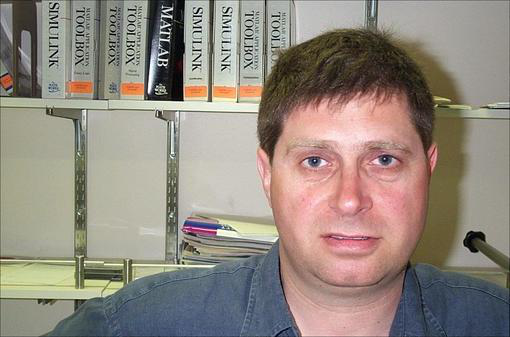

In [3]:
caltech101.__getitem__(index = 0)[0]  #max index 8676

In [4]:
dataset_mean_values = [0, 0, 0]
dataset_std_dev_values = [0, 0, 0]

In [5]:
for idx in range(len(caltech101)):
    img = caltech101.__getitem__(index=idx)[0]
    img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    img = img / 255.0  # Normalize pixel values to [0, 1]

    # Calculate mean and standard deviation for each channel
    for i in range(3):
        dataset_mean_values[i] += np.mean(img[:,:,i])
        dataset_std_dev_values[i] += np.std(img[:,:,i])

# Calculate final mean and standard deviation values
dataset_size = len(caltech101)
dataset_mean_values = [val / dataset_size for val in dataset_mean_values]
dataset_std_dev_values = [val / dataset_size for val in dataset_std_dev_values]

print(f'Mean values: {dataset_mean_values}')
print(f'Standard deviation values: {dataset_std_dev_values}')

Mean values: [0.5021372281891864, 0.5287581550675707, 0.5458470856851454]
Standard deviation values: [0.24773670511666424, 0.24607509728422117, 0.24912913964278197]


In [6]:
len(caltech101)

8677

## Feature Extraction Functionality

### Color Moments 

In [6]:
def color_moments_calculator(image):
    
    if image.shape[2] == 2:
        # If the image has 2 channels (e.g., grayscale), convert it to 3 channels (RGB)
        print("2 channels")
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    # Resize image to 300x100
    image = cv2.resize(image, (300, 100))
    
    # Partition the image into 10x10 grid
    rows = np.vsplit(image, 10)
    cells = [np.hsplit(row, 10) for row in rows]
    cells = np.array(cells).reshape(-1, 100, 3)

    # Initialize feature descriptor array
    color_moments = np.zeros((10, 10, 3, 3))

    # Compute color moments for each cell
    for row in range(10):
        for col in range(10):
            for ch in range(3):
                channel = cells[row*10 + col][:, ch]
                mean = np.mean(channel)
                std_dev = np.std(channel)
                skewness = skew(channel)
                color_moments[row, col, ch] = [mean, std_dev, skewness]

    return color_moments

In [7]:
def display_color_moments(color_moments):
    
    # Display a total of 100 subplots
    
    fig, axs = plt.subplots(10, 10, figsize=(30, 30))
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    
    custom_handles = [Line2D([0], [0], color='w', label='M - (Mean)', markerfacecolor='red', markersize=1),
                      Line2D([0], [0], color='w', label='St - (Std Dev)', markerfacecolor='green', markersize=1),
                      Line2D([0], [0], color='w', label='(Sk - Skewness)', markerfacecolor='blue', markersize=1)]

    for row in range(10):
        for col in range(10):
            moments = color_moments[row, col]
            ax = axs[row, col]

            positions = np.array([1, 2, 3])  # Adjust the positions of the groups

            # Group 1: Mean (Red, Green, Blue)
            ax.bar(positions, moments[:, 0], width=1, color=['red', 'green', 'blue'], alpha=0.5, label='M')

            # Group 2: Std Deviation (Red, Green, Blue)
            ax.bar(positions + 4, moments[:, 1], width=1, color=['red', 'green', 'blue'], alpha=0.5, label='St')

            # Group 3: Skewness (Red, Green, Blue)
            ax.bar(positions + 8, moments[:, 2], width=1, color=['red', 'green', 'blue'], alpha=0.5, label='Sk')

            ax.set_xticks([2, 6, 10])
            ax.set_xticklabels(['M', 'St', 'Sk'])
            ax.set_title(f'Cell ({row+1}, {col+1})')

    # Add legend at top right
    axs[0, -1].legend(handles=custom_handles, loc='upper right', bbox_to_anchor=(1.1, 1.5), frameon=False)

    plt.show()

In [8]:
index = 123
image = cv2.cvtColor(np.array(caltech101.__getitem__(index = index)[0]),cv2.COLOR_RGB2BGR)

In [9]:
image.shape

(331, 501, 3)

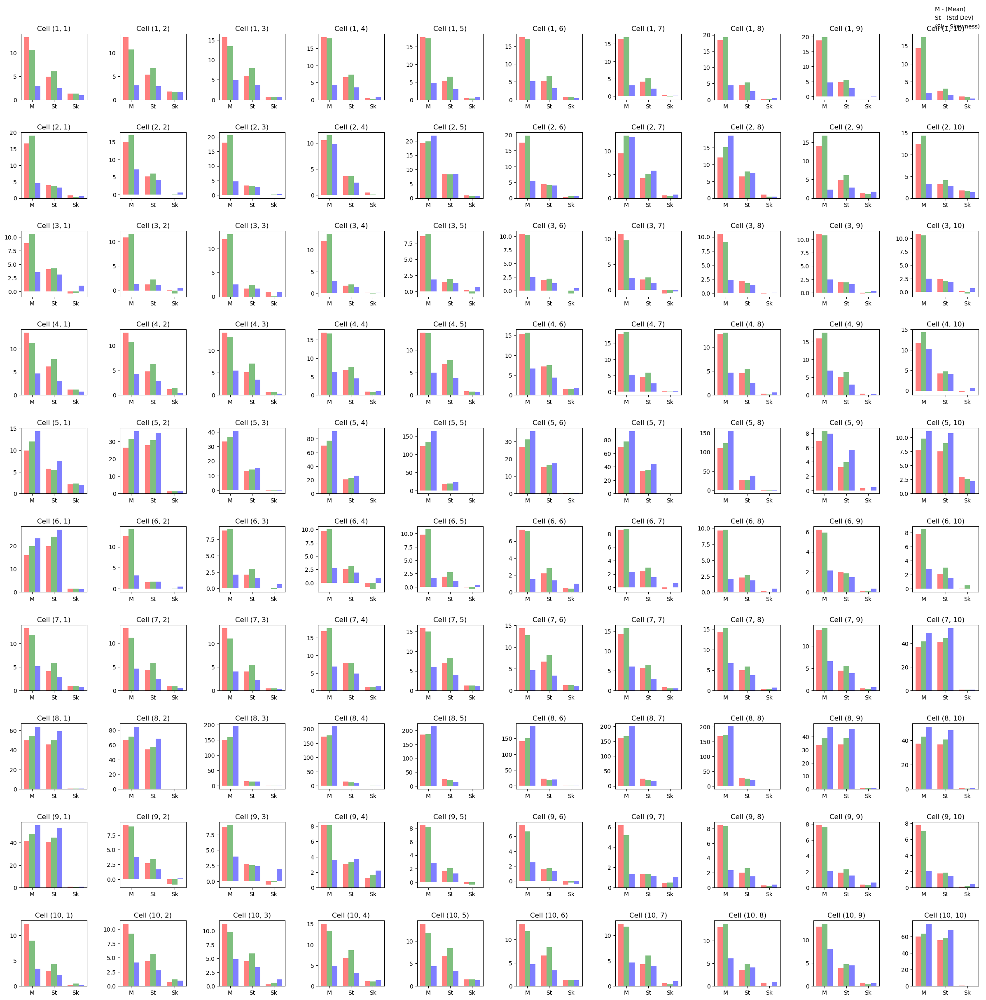

In [10]:
cm = color_moments_calculator(image)
display_color_moments(cm)

### Histograms of Oriented Gradients (HOG)  

In [11]:
def hog_calculator(image):
    # Convert the image to grayscale
    image_grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Resize image to 300x100
    image_resized = cv2.resize(image_grayscale, (300, 100))

    # Define the cell size
    cell_size = (30, 10)

    # Initialize the HOG descriptor array
    hog = []

    # Compute HOG descriptor for each cell
    for row in range(10):
        for col in range(10):
            # Extract the cell
            cell = image_resized[row*cell_size[1]:(row+1)*cell_size[1], col*cell_size[0]:(col+1)*cell_size[0]]

            # Calculate gradients using Sobel
            gradient_x = cv2.Sobel(cell, cv2.CV_64F, 1, 0, ksize=5)
            gradient_y = cv2.Sobel(cell, cv2.CV_64F, 0, 1, ksize=5)

            # Calculate gradient magnitude and orientation
            magnitude, angle = cv2.cartToPolar(gradient_x, gradient_y, angleInDegrees=True)

            # Calculate the histogram for this cell
            hist, _ = np.histogram(angle, bins=9, range=(0, 180), weights=magnitude)

            # Append the histogram values to the HOG descriptor
            hog.extend(hist)

    return np.array(hog)

In [12]:
hogdescriptor = hog_calculator(image)

In [13]:
hogdescriptor.shape

(900,)

In [14]:
def display_hog(hog_descriptor, cell_size=(30, 10)):
    # Create a black canvas
    background = np.zeros((100, 300), dtype=np.uint8)

    for row in range(10):
        for col in range(10):
            # Calculate the center of the cell
            center = (col*cell_size[0] + cell_size[0]//2, row*cell_size[1] + cell_size[1]//2)

            # Calculate the endpoint of the gradient vector based on the HOG descriptor
            angle = (hog_descriptor[row*10 + col] * 20) - 90
            length = min(cell_size) // 2
            endpoint = (int(center[0] + length * np.cos(np.radians(angle))),
                        int(center[1] + length * np.sin(np.radians(angle))))

            # Draw a line on the canvas
            cv2.line(background, center, endpoint, 255, 1)

    # Display the visualization using matplotlib
    plt.imshow(background, cmap='gray')
    plt.axis('off')
    plt.show()

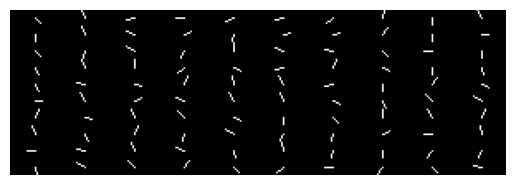

In [15]:
display_hog(hogdescriptor)

### ResNet-AvgPool-1024 

In [16]:
resnet_model = resnet50(pretrained=True)

In [17]:
def avgpool_calculator(image):
    
    # Define a hook to get the output of the "avgpool" layer
    output_hook = None
    def hook_fn(module, input, output):
        nonlocal output_hook
        output_hook = output

    # Attach the hook to the "avgpool" layer
    resnet_model.avgpool.register_forward_hook(hook_fn)

    # Define a function to preprocess the image
    def preprocess_image(image):
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=dataset_mean_values, std=dataset_std_dev_values),
        ])
        return transform(image).unsqueeze(0)

    # Define a function to get the 2048-dimensional vector
    def get_2048_dimensional_vector(image):
        input_tensor = preprocess_image(image)
        resnet_model.eval()
        with torch.no_grad():
            _ = resnet_model(input_tensor)
        return output_hook.squeeze().numpy()

    # Get the 2048-dimensional vector
    vector_2048 = get_2048_dimensional_vector(image)

    # Reduce dimensions to 1024 by averaging adjacent entries
    vector_1024 = [(v1 + v2) / 2 for v1, v2 in zip(vector_2048[::2], vector_2048[1::2])]

    return vector_1024

In [18]:
def display_feature_vector(vector):
    plt.figure(figsize=(10,5))
    plt.bar(range(len(vector)), vector)
    plt.title('Feature Vector Visualization')
    plt.xlabel('Dimension')
    plt.ylabel('Value')
    plt.show()

In [19]:
avgpool_fd = avgpool_calculator(image)

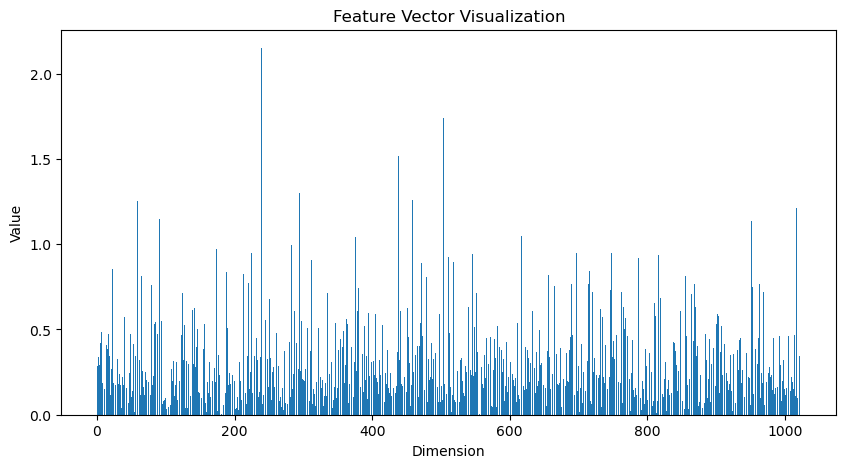

In [20]:
display_feature_vector(avgpool_fd)

### ResNet-Layer3-1024 

In [21]:
def layer3_calculator(image):
    
    # Define a hook to get the output of the "layer3" layer
    output_hook = None
    def hook_fn(module, input, output):
        nonlocal output_hook
        output_hook = output

    # Attach the hook to the "layer3" layer
    resnet_model.layer3.register_forward_hook(hook_fn)

    # Define a function to preprocess the image
    def preprocess_image(image):
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=dataset_mean_values, std=dataset_std_dev_values),
        ])
        return transform(image).unsqueeze(0)

    # Define a function to get the 1024x14x14 tensor
    def get_1024x14x14_tensor(image):
        input_tensor = preprocess_image(image)
        resnet_model.eval()
        with torch.no_grad():
            _ = resnet_model(input_tensor)
        return output_hook.squeeze()

    # Get the 1024x14x14 tensor
    tensor_1024x14x14 = get_1024x14x14_tensor(image)

    # Convert the tensor to a 1024-dimensional vector by averaging each 14x14 slice
    vector_1024 = torch.mean(tensor_1024x14x14.view(1024, -1), dim=1).numpy()

    return vector_1024

In [22]:
layer3_fd = layer3_calculator(image)

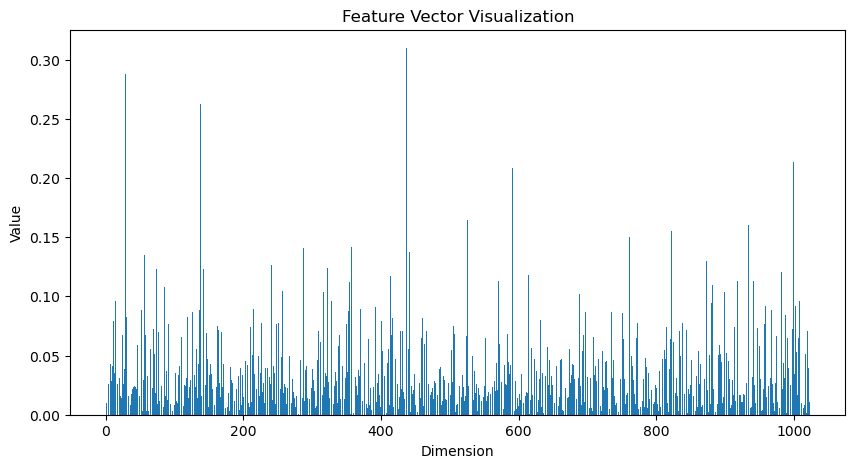

In [23]:
display_feature_vector(layer3_fd)

###  ResNet-FC-1000

In [24]:
def fc_calculator(image):
    
    # Define a hook to get the output of the "fc" layer
    output_hook = None
    def hook_fn(module, input, output):
        nonlocal output_hook
        output_hook = output

    # Attach the hook to the "fc" layer
    resnet_model.fc.register_forward_hook(hook_fn)

    # Define a function to preprocess the image
    def preprocess_image(image):
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=dataset_mean_values, std=dataset_std_dev_values),
        ])
        return transform(image).unsqueeze(0)

    # Define a function to get the 1000-dimensional tensor
    def get_1000_dimensional_tensor(image):
        input_tensor = preprocess_image(image)
        resnet_model.eval()
        with torch.no_grad():
            _ = resnet_model(input_tensor)
        return output_hook.squeeze()

    # Get the 1000-dimensional tensor
    tensor_1000 = get_1000_dimensional_tensor(image)

    return tensor_1000

In [25]:
fc_fd = fc_calculator(image)

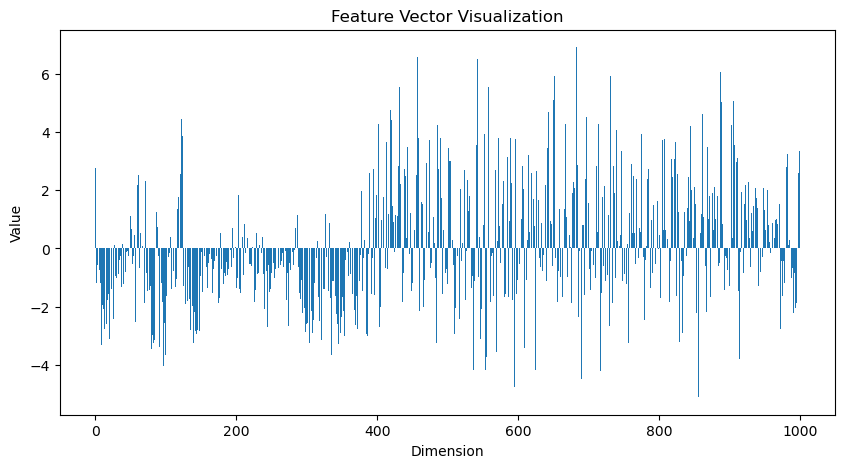

In [26]:
display_feature_vector(fc_fd)

## Similarity Scores 

### Euclidean Distance for Color Moments 

In [27]:
def featurenormalize(feature_vector):
    # Normalize the feature vector to have unit length
    if np.isnan(feature_vector).any():
        # Handle the presence of NaN values (e.g., replace with zeros)
        feature_vector = np.nan_to_num(feature_vector)

    # Calculate the L2 norm of the feature_vector
    norm = np.linalg.norm(feature_vector)
    return feature_vector / norm if norm != 0 else feature_vector

def euclidean_distance_calculator(x, y):
    return np.linalg.norm(x - y)

def similarity_score_color_moments(moments1, moments2):
    # Normalize the feature vectors
    moments1_normalized = featurenormalize(moments1)
    moments2_normalized = featurenormalize(moments2)
    
    # Calculate the Euclidean Distance
    similarity = euclidean_distance_calculator(moments1_normalized, moments2_normalized)

    return round(similarity,5)

### Cosine Similarity for HOG

In [28]:
def cosine_similarity_calculator(descriptor1, descriptor2, normalize=True):
    if normalize:
        descriptor1 = featurenormalize(descriptor1)
        descriptor2 = featurenormalize(descriptor2)
    
    # Reshape descriptors as needed
    descriptor1 = np.reshape(descriptor1, (1, -1))
    descriptor2 = np.reshape(descriptor2, (1, -1))

    similarity = cosine_similarity(descriptor1, descriptor2)
    return similarity[0][0]

In [29]:
def similarity_score_hog(descriptor1, descriptor2):
    return round(cosine_similarity_calculator([descriptor1], [descriptor2]),5)

### Cosine Similarity for Avgpool 

In [30]:
def similarity_score_avgpool(descriptor1, descriptor2):
    # Calculate Cosine Similarity for avgpool descriptors
    return round(cosine_similarity_calculator([descriptor1], [descriptor2]),5)

### Euclidean Distance for Layer3

In [31]:
def similarity_score_layer3(descriptor1, descriptor2):
    # Calculate Euclidean distance between two layer3 descriptors
    desc1_normalized = featurenormalize(descriptor1)
    desc2_normalized = featurenormalize(descriptor2)

    # Calculate the Euclidean Distance
    similarity = euclidean_distance_calculator(desc1_normalized, desc2_normalized)

    return round(similarity,5)

### Cosine Similarity for FC

In [32]:
def similarity_score_fc(descriptor1, descriptor2):
    # Convert to NumPy arrays if they are of type torch.Tensor
    if isinstance(descriptor1, torch.Tensor):
        descriptor1 = descriptor1.numpy()
    if isinstance(descriptor2, torch.Tensor):
        descriptor2 = descriptor2.numpy()

    # Calculate Cosine Similarity for fc descriptors
    return round(cosine_similarity_calculator([descriptor1], [descriptor2]), 5)

## Testing between images

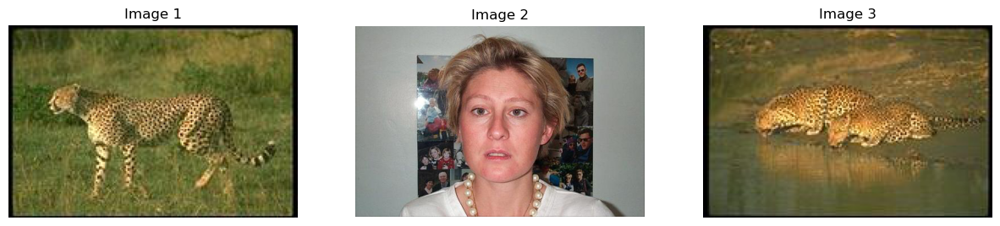

In [33]:
image1 = cv2.cvtColor(np.array(caltech101.__getitem__(index=999)[0]), cv2.COLOR_RGB2BGR)
image2 = cv2.cvtColor(np.array(caltech101.__getitem__(index=279)[0]), cv2.COLOR_RGB2BGR)
image3 = cv2.cvtColor(np.array(caltech101.__getitem__(index=927)[0]), cv2.COLOR_RGB2BGR)

#Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Display the first image
axes[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
axes[0].set_title('Image 1')

# Display the second image
axes[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
axes[1].set_title('Image 2')

# Display the third image
axes[2].imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
axes[2].set_title('Image 3')

# Hide axis labels
for ax in axes:
    ax.axis('off')

# Show the plot
plt.show()

In [34]:
cm1 = color_moments_calculator(image1)
cm2 = color_moments_calculator(image2)
cm3 = color_moments_calculator(image3)

In [35]:
hog1= hog_calculator(image1)
hog2= hog_calculator(image2)
hog3= hog_calculator(image3)

In [36]:
avgpool1 = avgpool_calculator(image1)
avgpool2 = avgpool_calculator(image2)
avgpool3 = avgpool_calculator(image3)

In [37]:
layer3_1 = layer3_calculator(image1)
layer3_2 = layer3_calculator(image2)
layer3_3 = layer3_calculator(image3)

In [38]:
fc1 = fc_calculator(image1)
fc2 = fc_calculator(image2)
fc3 = fc_calculator(image3)

In [39]:
print(similarity_score_color_moments(cm1,cm2))
print(similarity_score_color_moments(cm2,cm3))
print(similarity_score_color_moments(cm1,cm3))

0.51572
0.53204
0.21044


In [40]:
print(similarity_score_hog(hog1,hog2))
print(similarity_score_hog(hog2,hog3))
print(similarity_score_hog(hog1,hog3))

0.27501
0.19086
0.89264


In [41]:
print(similarity_score_avgpool(avgpool1,avgpool2))
print(similarity_score_avgpool(avgpool2,avgpool3))
print(similarity_score_avgpool(avgpool3,avgpool1))

0.62808
0.63481
0.82484


In [42]:
print(similarity_score_layer3(layer3_1,layer3_2))
print(similarity_score_layer3(layer3_2,layer3_3))
print(similarity_score_layer3(layer3_3,layer3_1))

0.73863
0.70256
0.32352


In [43]:
print(similarity_score_fc(fc1,fc2))
print(similarity_score_fc(fc2,fc3))
print(similarity_score_fc(fc3,fc1))

-0.04353
0.00482
0.56795


## MongoDB

In [44]:
import pymongo
from pymongo import MongoClient

client = MongoClient('localhost',27017)
db = client['CSE515-MWD-Nikhil_V_Ramanan-ProjectPhase1']
collection = db['image_features']
collection

Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'CSE515-MWD-Nikhil_V_Ramanan-ProjectPhase1'), 'image_features')

In [45]:
def descriptor_calculator(image, idx):
    color_moments = color_moments_calculator(image)
    hog_descriptor = hog_calculator(image)
    avgpool_descriptor = avgpool_calculator(image)
    layer3_descriptor = layer3_calculator(image)
    fc_descriptor = fc_calculator(image)
    
    return {
        '_id': idx,
        'image': image.tolist() if isinstance(image, np.ndarray) else image,  # Convert the image to a list for storage
        'color_moments': color_moments.tolist() if isinstance(color_moments, np.ndarray) else color_moments,
        'hog_descriptor': hog_descriptor.tolist() if isinstance(hog_descriptor, np.ndarray) else hog_descriptor,
        'avgpool_descriptor': avgpool_descriptor.tolist() if isinstance(avgpool_descriptor, np.ndarray) else avgpool_descriptor,
        'layer3_descriptor': layer3_descriptor.tolist() if isinstance(layer3_descriptor, np.ndarray) else layer3_descriptor,
        'fc_descriptor': fc_descriptor.tolist()
    }

In [46]:
def push_dataset_to_mongodb():
    for idx in tqdm(range(len(caltech101))):
        image = cv2.cvtColor(np.array(caltech101.__getitem__(index = idx)[0]),cv2.COLOR_RGB2BGR)
        descriptors = descriptor_calculator(image, idx)
        collection.update_one({'_id':idx},{'$set':descriptors},upsert = True)

In [47]:
def push_descriptors_to_mongodb(descriptors):
    idx = descriptors["_idx"]
    collection.update_one({'_id':idx},{'$set':descriptors},upsert = True)

In [ ]:
#Not re-running this cell for the final output, as DB already contains relevant data 
push_dataset_to_mongodb()

In [50]:
document = collection.find_one({'_id': 0})

# Print the entire document
print(document)

{'_id': 0, 'avgpool_descriptor': [0.6983373761177063, 0.20853319764137268, 0.5981616377830505, 0.8540186882019043, 0.3424229025840759, 0.7490401268005371, 0.2765335440635681, 0.5663641095161438, 0.4730461835861206, 0.2957353889942169, 0.4719884395599365, 0.25618916749954224, 0.11575663089752197, 0.6467657089233398, 0.41967636346817017, 0.10429954528808594, 0.9220832586288452, 0.5827615261077881, 0.5775259733200073, 0.22697195410728455, 0.4175265431404114, 0.5529932975769043, 0.3265415132045746, 0.5998548865318298, 0.5908539295196533, 0.37831056118011475, 0.5684564113616943, 0.4216517210006714, 0.1343120038509369, 0.4357587695121765, 0.12766802310943604, 0.47614786028862, 0.63840651512146, 1.023945689201355, 0.3573382496833801, 0.5507346391677856, 0.13894051313400269, 0.92454993724823, 0.43028926849365234, 0.3004898130893707, 0.3631763756275177, 0.33344846963882446, 1.05837881565094, 0.5544559955596924, 0.57636559009552, 0.7004114389419556, 0.49056345224380493, 0.29215919971466064, 0.36

In [51]:
def to_base64(image):
    from io import BytesIO
    import base64

    image_pil = Image.fromarray(image)
    buffered = BytesIO()
    image_pil.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode()

def display_image_centered(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_html = f"<img src='data:image/png;base64,{to_base64(image)}' style='display: block; margin-left: auto; margin-right: auto;'>"
    display(HTML(image_html))


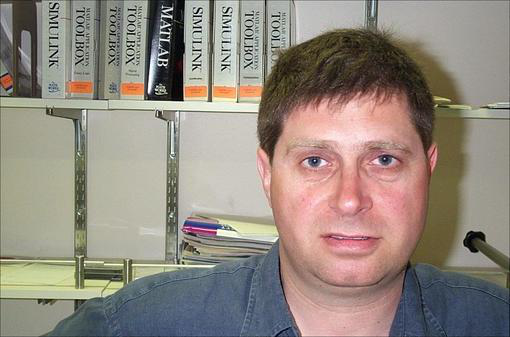

In [52]:
image = np.array(document['image'], dtype=np.uint8)
display_image_centered(image)

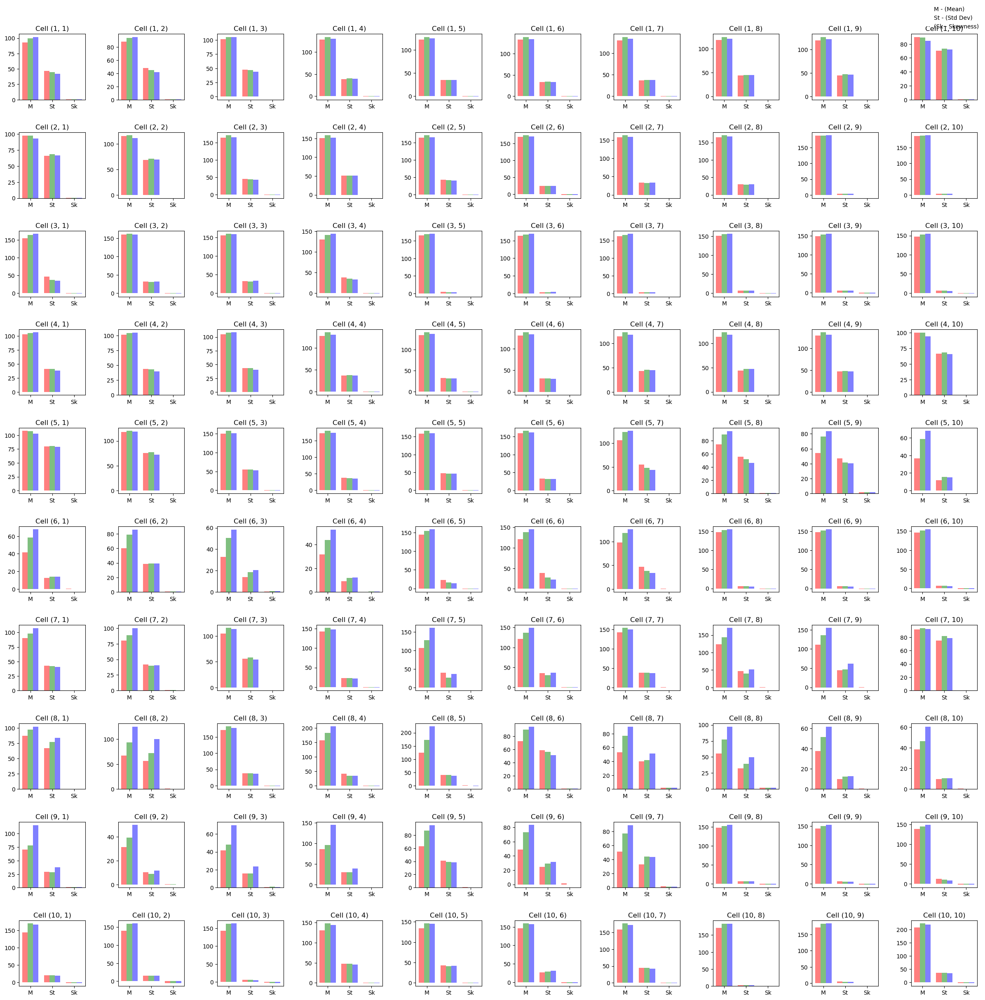

In [53]:
display_color_moments(np.array(document['color_moments']))

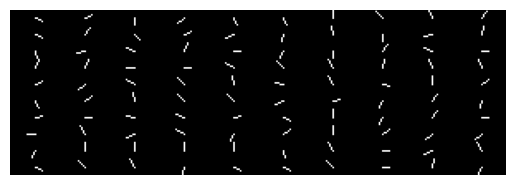

In [54]:
display_hog(document['hog_descriptor'])

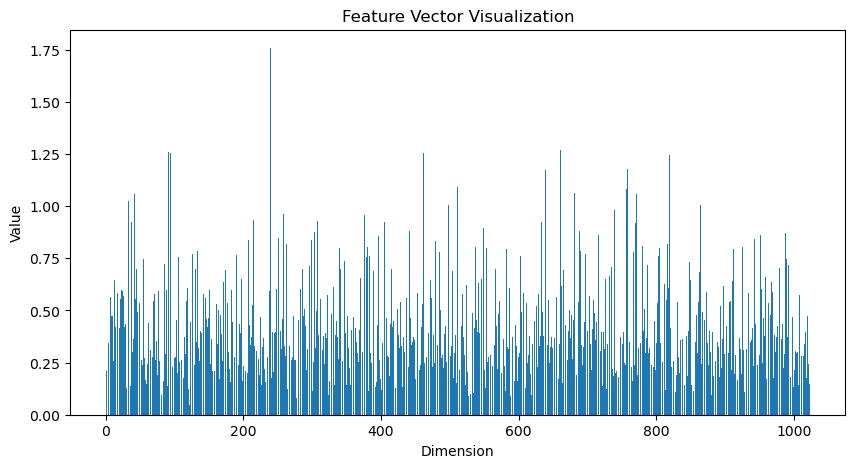

In [55]:
display_feature_vector(document['avgpool_descriptor'])

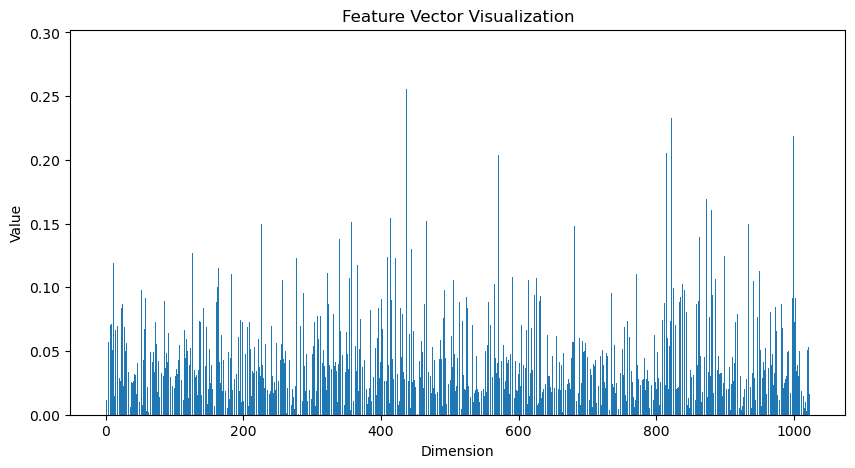

In [56]:
display_feature_vector(document['layer3_descriptor'])

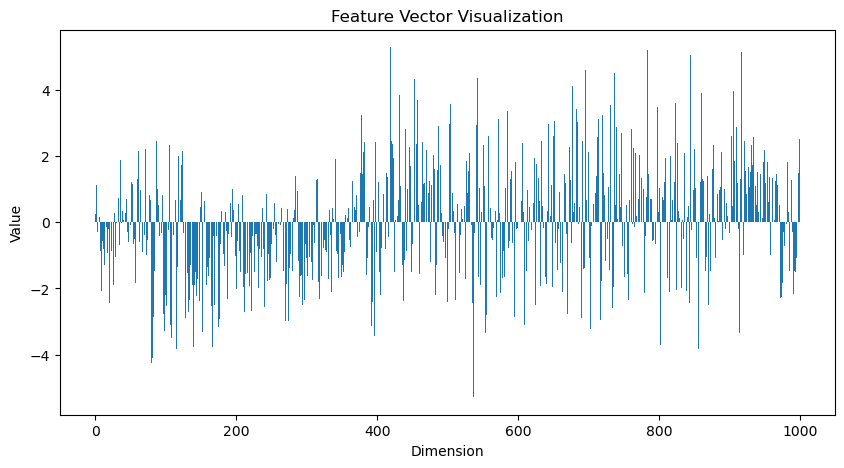

In [57]:
display_feature_vector(document['fc_descriptor'])

## Calculate similarity scores

In [58]:
def similarity_calculator(index):
    imagedata1 = collection.find_one({'_id': index})
    similarities = {
        "color_moments": {},
        "hog_descriptor": {},
        "avgpool_descriptor": {},
        "layer3_descriptor": {},
        "fc_descriptor": {}
    }
    
    for cmpidx in tqdm(range(len(caltech101))):
        if cmpidx != index:
            imagedata2 = collection.find_one({"_id": cmpidx})
            
            # Corrected the use of 'not' instead of '!'
            color_moments_similarity = similarity_score_color_moments(imagedata1["color_moments"], imagedata2["color_moments"])
            histogram_similarity = similarity_score_hog(imagedata1["hog_descriptor"], imagedata2["hog_descriptor"])
            avgpool_similarity = similarity_score_avgpool(imagedata1["avgpool_descriptor"], imagedata2["avgpool_descriptor"])
            layer3_similarity = similarity_score_layer3(imagedata1["layer3_descriptor"], imagedata2["layer3_descriptor"]) 
            fc_similarity = similarity_score_fc(imagedata1["fc_descriptor"], imagedata2["fc_descriptor"])
            if not np.isnan(color_moments_similarity):
                similarities["color_moments"][cmpidx] = color_moments_similarity
            else: 
                similarities["color_moments"][cmpidx] = 1
            similarities["hog_descriptor"][cmpidx] =  histogram_similarity
            similarities["avgpool_descriptor"][cmpidx] =  avgpool_similarity
            similarities["layer3_descriptor"][cmpidx] = layer3_similarity
            similarities["fc_descriptor"][cmpidx] =  fc_similarity
    
    return similarities

In [59]:
similarity_scores = similarity_calculator(1024)

  0%|          | 0/8677 [00:00<?, ?it/s]

In [60]:
def display_images(images, indices, similarity_scores, rows, cols):
    
    k = len(images)

    # Create a grid of subplots
    fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
    fig.subplots_adjust(wspace=0.3, hspace=0.5)

    for i, ax in enumerate(axes.flat):
        if i < k:
            ax.imshow(images[i], cmap='gray')  # Assuming grayscale images
            ax.axis('off')
            ax.set_title(f"Index: {indices[i]}", fontsize=10)
            ax.text(
                0.5, -0.15, f"Similarity Score: {similarity_scores[i]:.5f}",
                transform=ax.transAxes,
                fontsize=10,
                ha='center'
            )
        else:
            ax.axis('off')

    plt.show()

In [61]:
def show_ksimilar(k_similar):
    images = []
    indices = []
    similarity_scores = []
    count = len(k_similar.keys())
    rows = int(count/5)
    if (rows*5)<count: rows+=1
    cols = 5
    for index in k_similar.keys():
        document = collection.find_one({'_id': index})
        images.append(cv2.cvtColor(np.array(document['image'], dtype=np.uint8), cv2.COLOR_BGR2RGB))
        indices.append(index)
        similarity_scores.append(k_similar[index])
        
    display_images(images, indices, similarity_scores, rows, cols)    


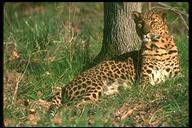

In [62]:
imagedata = collection.find_one({'_id': 1024})
image = np.array(imagedata['image'], dtype=np.uint8)
display_image_centered(image)

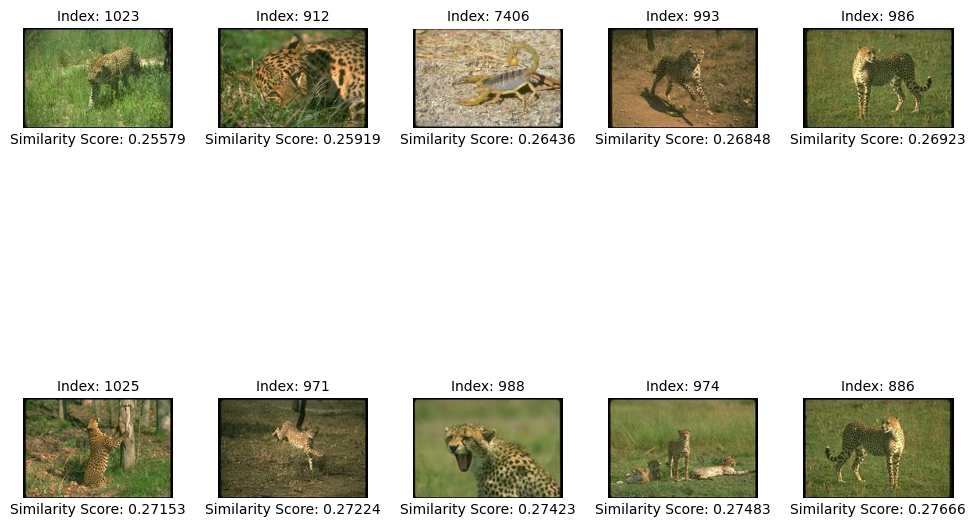

In [63]:
k = 10
color_moments_similar = dict(sorted(similarity_scores["color_moments"].items(), key = lambda x: x[1])[:k])
show_ksimilar(color_moments_similar)

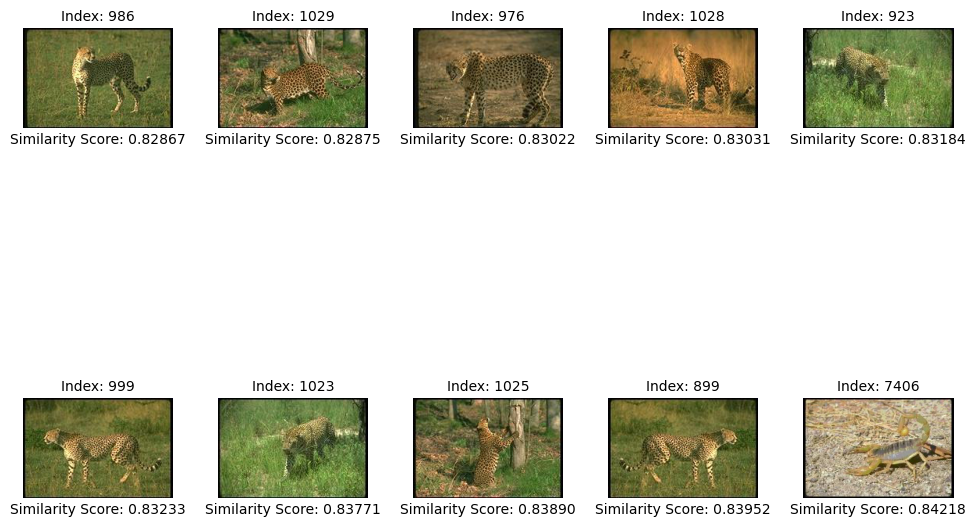

In [64]:
hog_similar = dict(sorted(similarity_scores["hog_descriptor"].items(), key = lambda x: x[1])[-k:])
show_ksimilar(hog_similar)

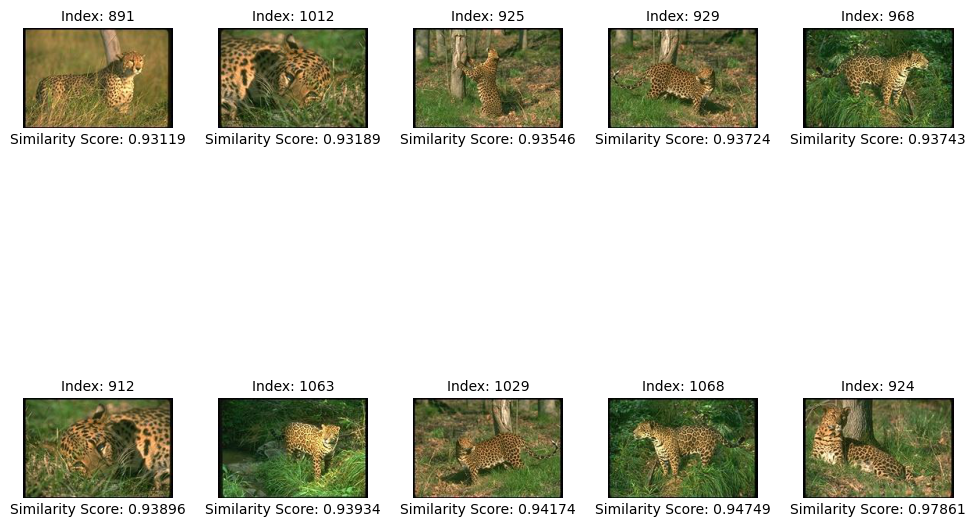

In [65]:
avgpool_similar = dict(sorted(similarity_scores["avgpool_descriptor"].items(), key = lambda x: x[1])[-k:])
show_ksimilar(avgpool_similar)

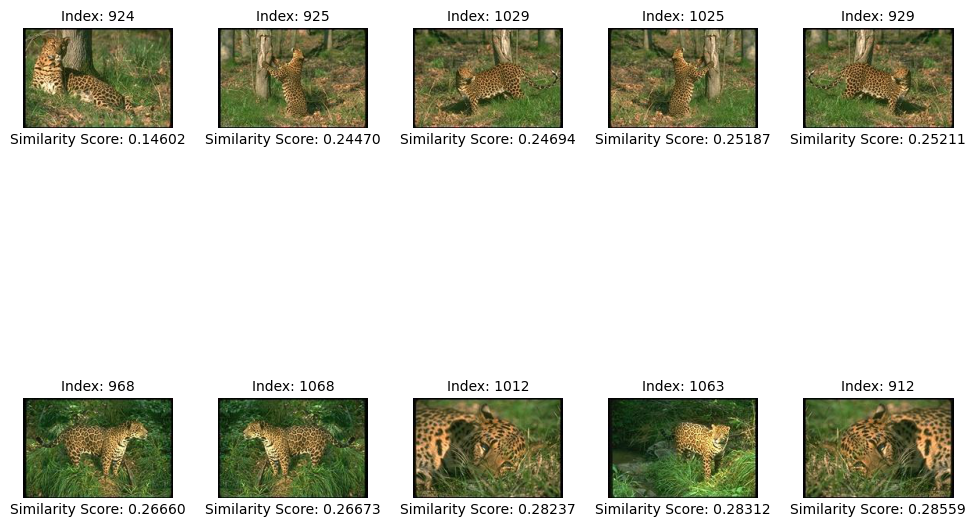

In [66]:
layer3_similar = dict(sorted(similarity_scores["layer3_descriptor"].items(), key = lambda x: x[1])[:k])
show_ksimilar(layer3_similar)

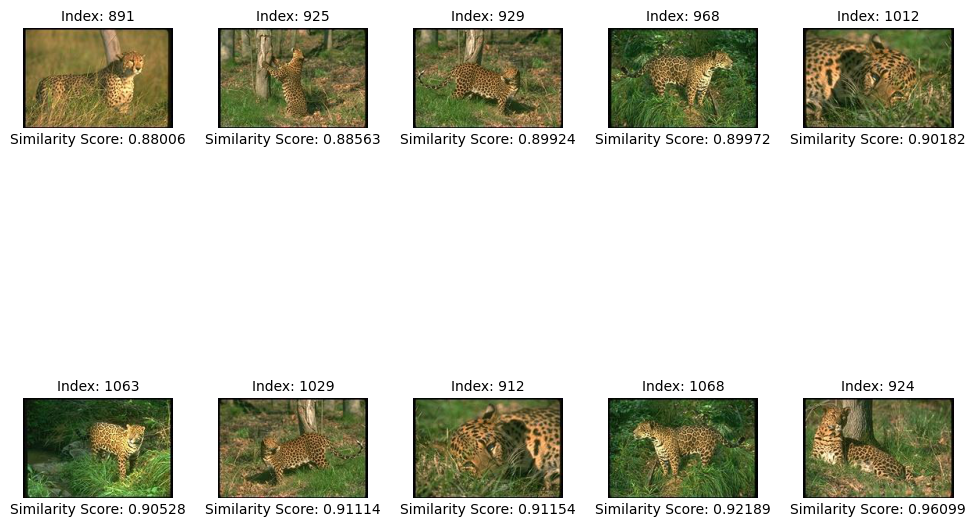

In [67]:
fc_similar = dict(sorted(similarity_scores["fc_descriptor"].items(), key = lambda x: x[1])[-k:])
show_ksimilar(fc_similar)

In [68]:
def queryksimilar(index,k):
    similarity_scores = similarity_calculator(index)
    color_moments_similar = dict(sorted(similarity_scores["color_moments"].items(), key = lambda x: x[1])[:k])
    hog_similar = dict(sorted(similarity_scores["hog_descriptor"].items(), key = lambda x: x[1])[-k:])
    avgpool_similar = dict(sorted(similarity_scores["avgpool_descriptor"].items(), key = lambda x: x[1])[-k:])
    layer3_similar = dict(sorted(similarity_scores["layer3_descriptor"].items(), key = lambda x: x[1])[:k])
    fc_similar = dict(sorted(similarity_scores["fc_descriptor"].items(), key = lambda x: x[1])[-k:])
    imagedata = collection.find_one({'_id': index})
    image = np.array(imagedata['image'], dtype=np.uint8)
    display(Markdown("### Query Image"))
    display_image_centered(np.array(image))
    display(Markdown("### Query Image Color Moments"))
    display_color_moments(np.array(imagedata['color_moments']))
    display(Markdown("### Query Image HOG Descriptor"))
    display_hog(imagedata['hog_descriptor'])
    display(Markdown("### Query Image Avgpool Descriptor"))
    display_feature_vector(imagedata['avgpool_descriptor'])
    display(Markdown("### Query Image Layer3 Descriptor"))
    display_feature_vector(imagedata['layer3_descriptor'])
    display(Markdown("### Query Image FC Descriptor"))
    display_feature_vector(imagedata['fc_descriptor'])
    display(Markdown('### Color Moments - Euclidean Distance'))
    show_ksimilar(color_moments_similar)
    display(Markdown('### Histograms of Oriented Gradients(HOG) - Cosine Similarity'))
    show_ksimilar(hog_similar)
    display(Markdown('### ResNet-AvgPool-1024 - Cosine Similarity'))
    show_ksimilar(avgpool_similar)
    display(Markdown('### ResNet-Layer3-1024 - Euclidean Distance'))
    show_ksimilar(layer3_similar)
    display(Markdown('### ResNet-FC-1000 - Cosine Similarity'))
    show_ksimilar(fc_similar)
    return similarity_scores

## Query Images Output

  0%|          | 0/8677 [00:00<?, ?it/s]

### Query Image


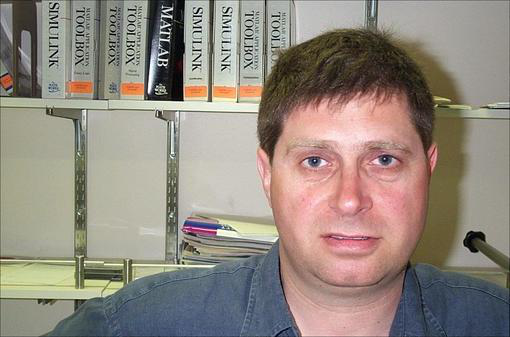

### Query Image Color Moments

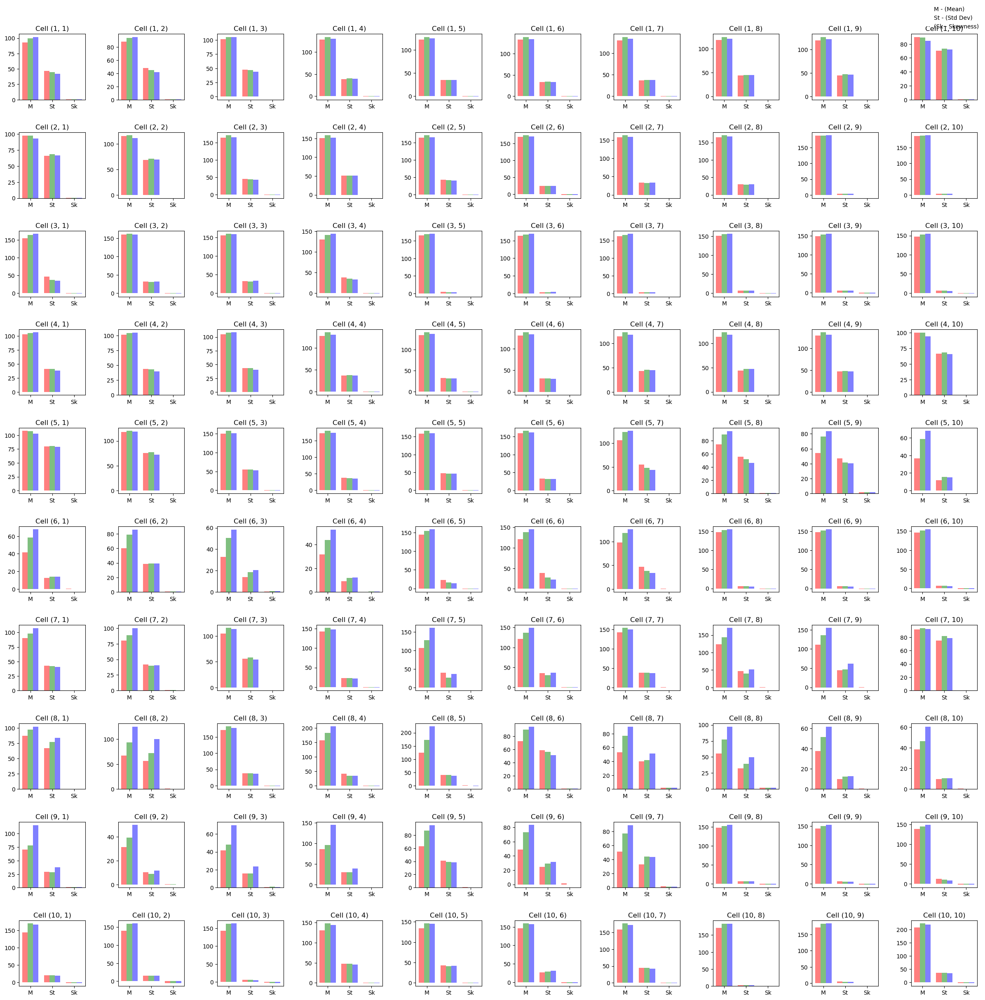

### Query Image HOG Descriptor

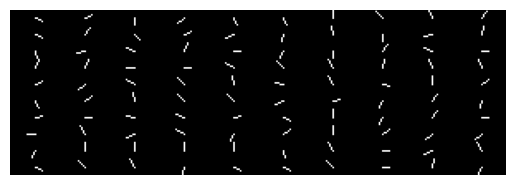

### Query Image Avgpool Descriptor

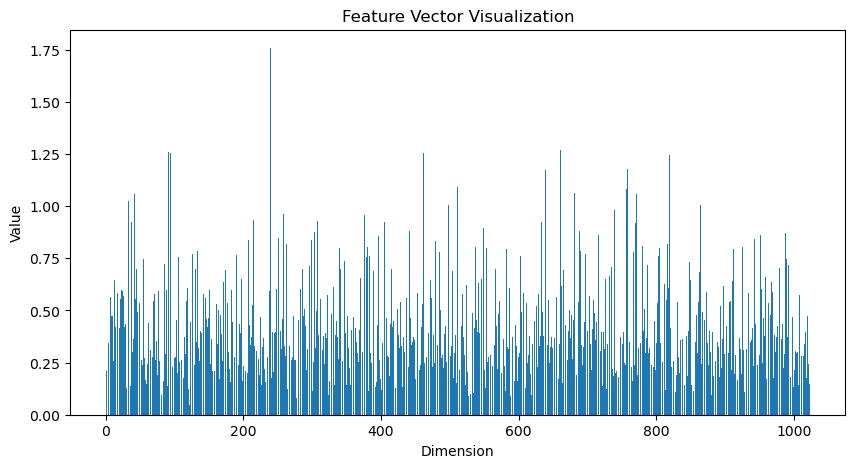

### Query Image Layer3 Descriptor

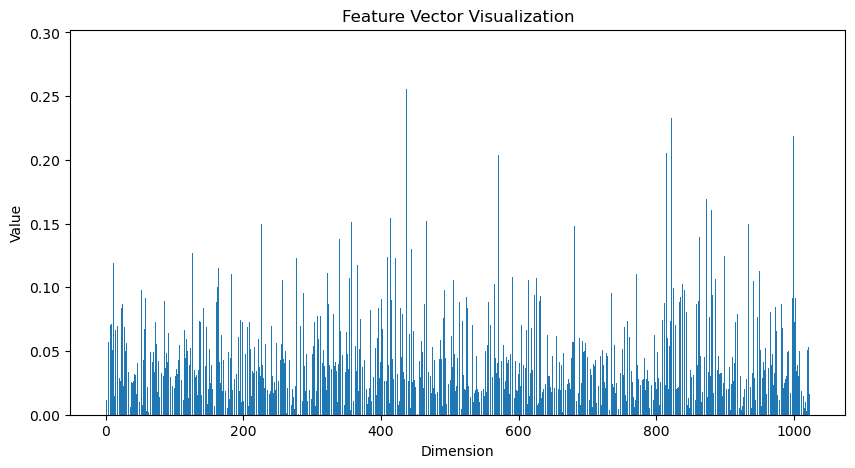

### Query Image FC Descriptor

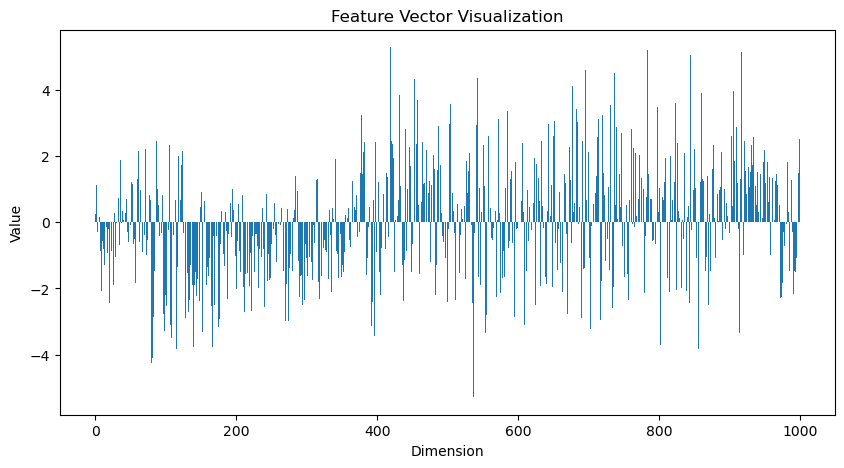

### Color Moments - Euclidean Distance

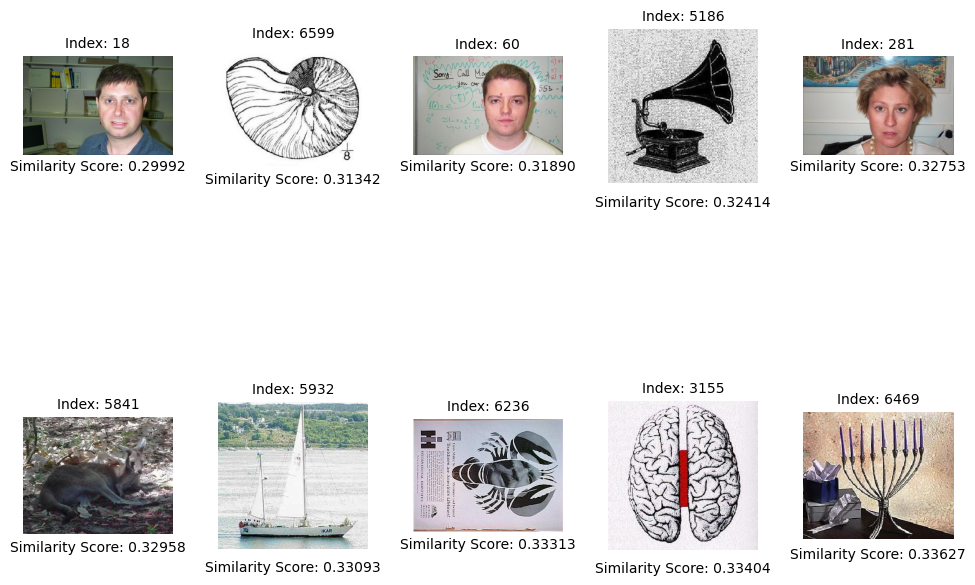

### Histograms of Oriented Gradients(HOG) - Cosine Similarity

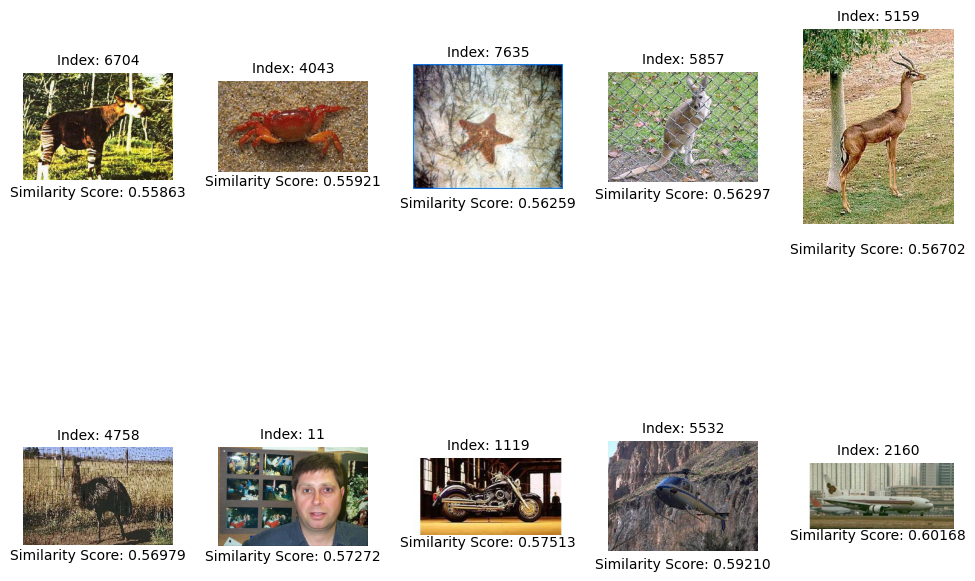

### ResNet-AvgPool-1024 - Cosine Similarity

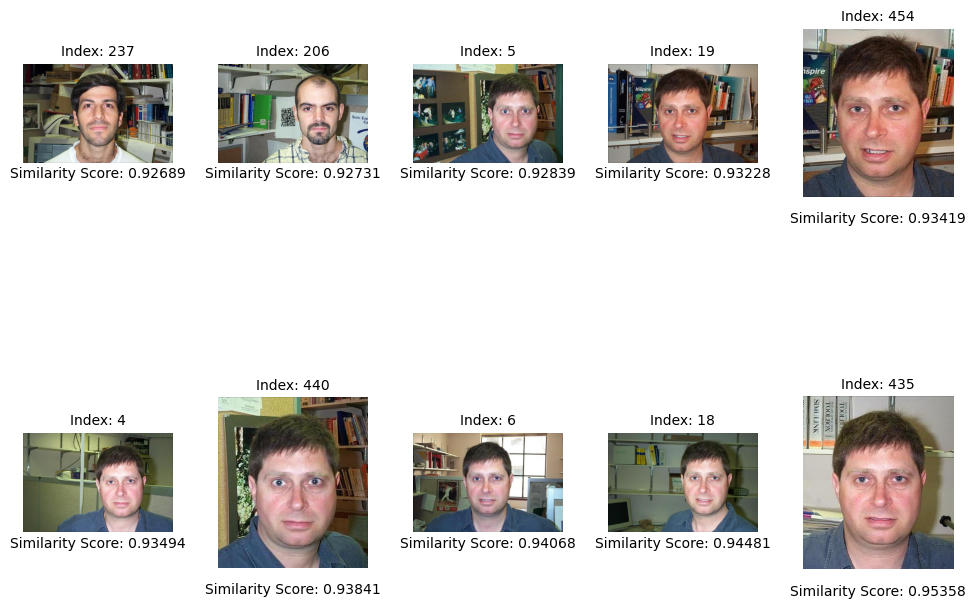

### ResNet-Layer3-1024 - Euclidean Distance

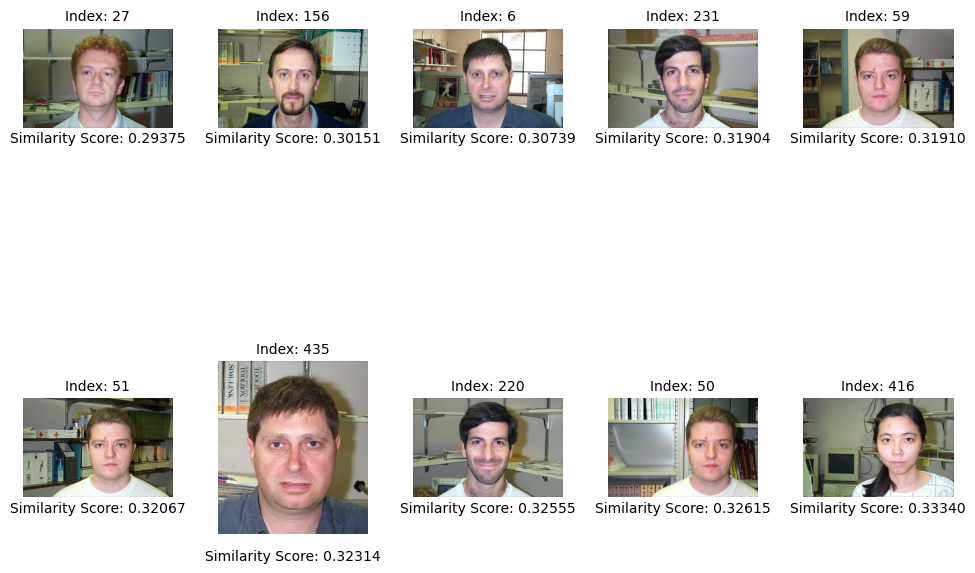

### ResNet-FC-1000 - Cosine Similarity

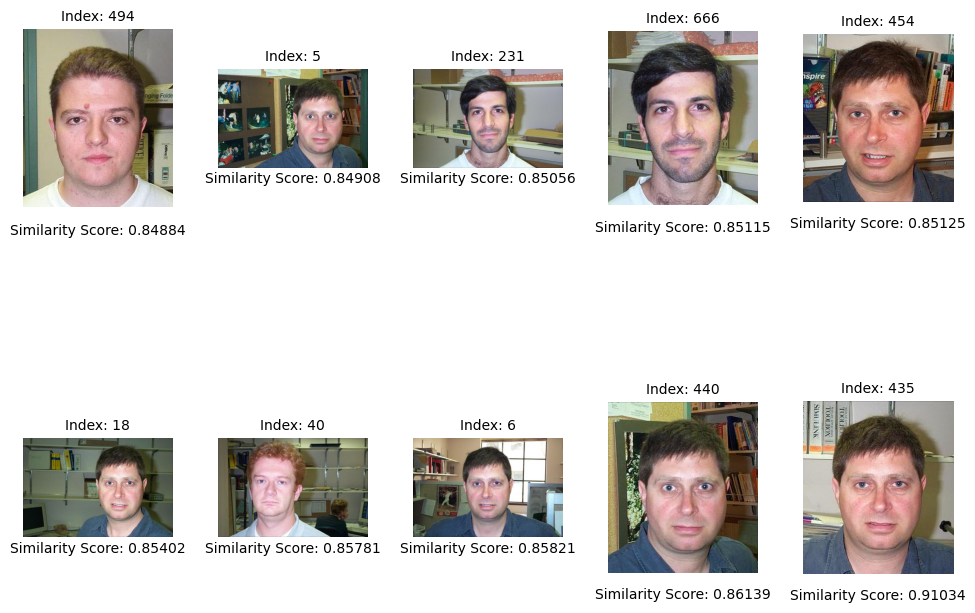

In [69]:
similarity_scores0 = queryksimilar(0,10)

  0%|          | 0/8677 [00:00<?, ?it/s]

### Query Image


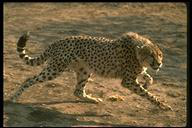

### Query Image Color Moments

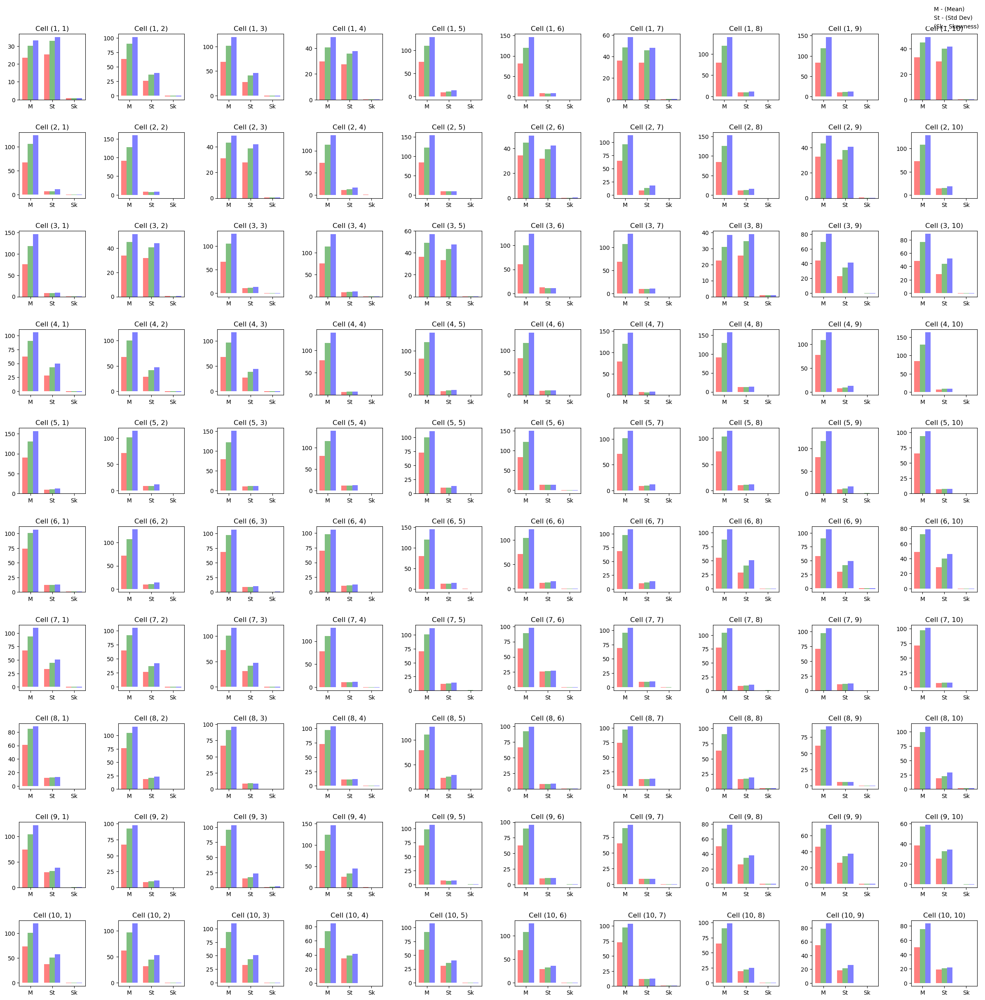

### Query Image HOG Descriptor

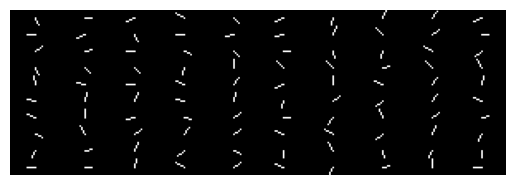

### Query Image Avgpool Descriptor

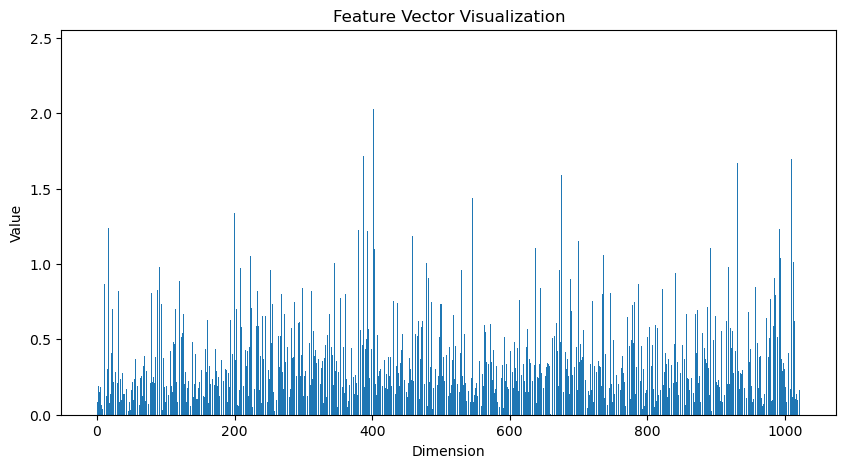

### Query Image Layer3 Descriptor

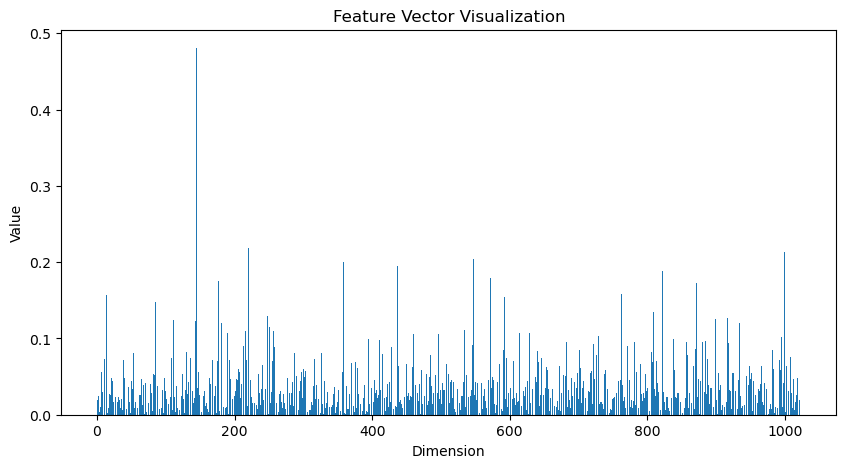

### Query Image FC Descriptor

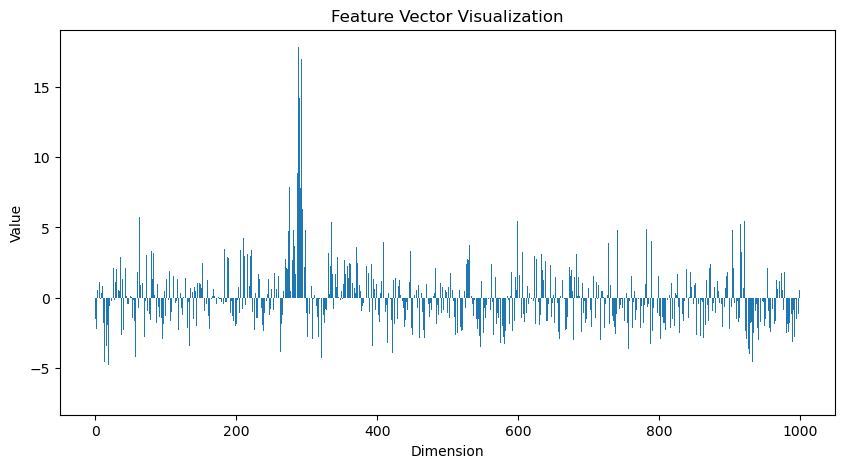

### Color Moments - Euclidean Distance

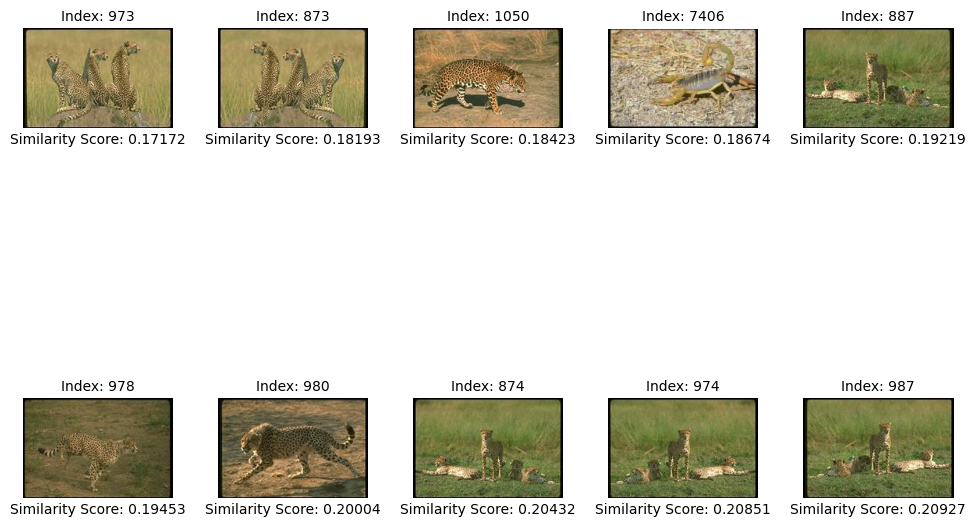

### Histograms of Oriented Gradients(HOG) - Cosine Similarity

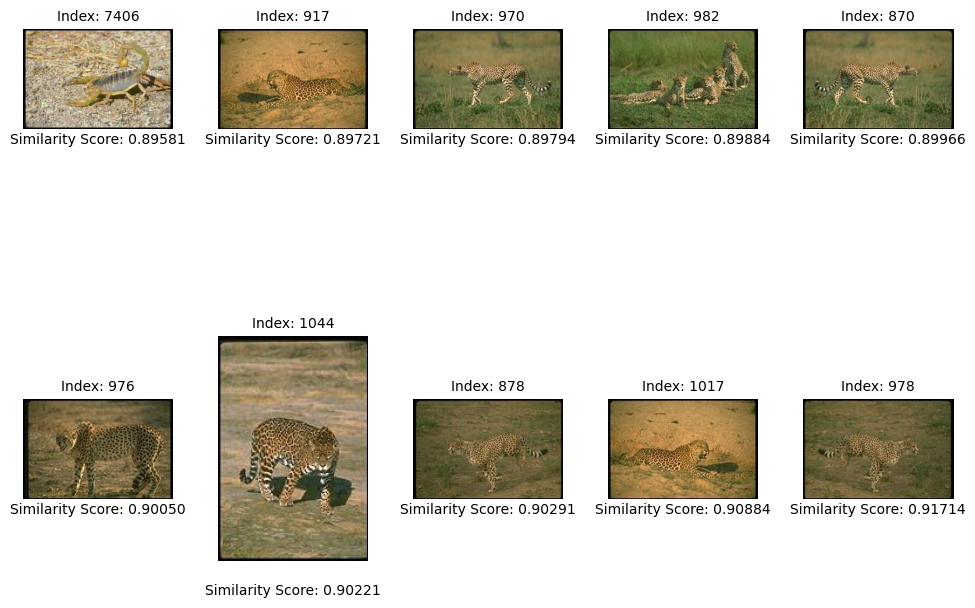

### ResNet-AvgPool-1024 - Cosine Similarity

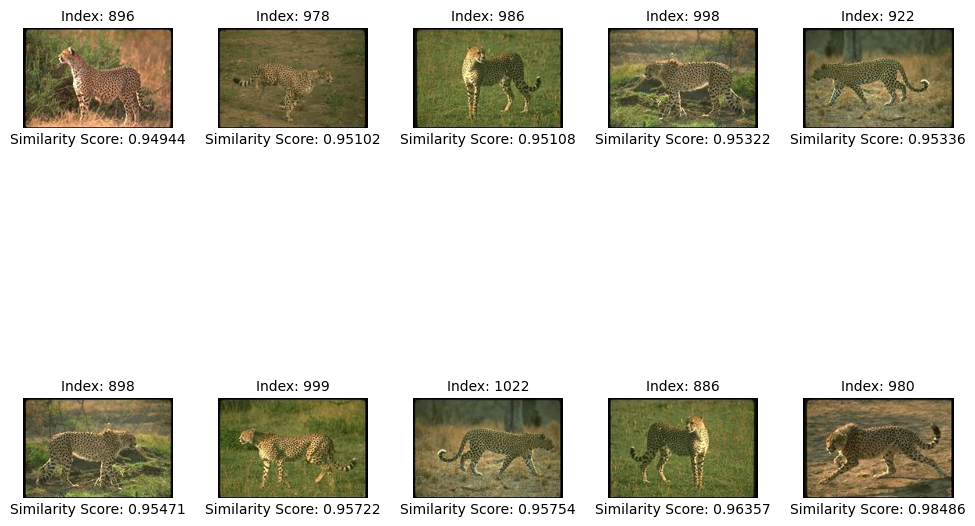

### ResNet-Layer3-1024 - Euclidean Distance

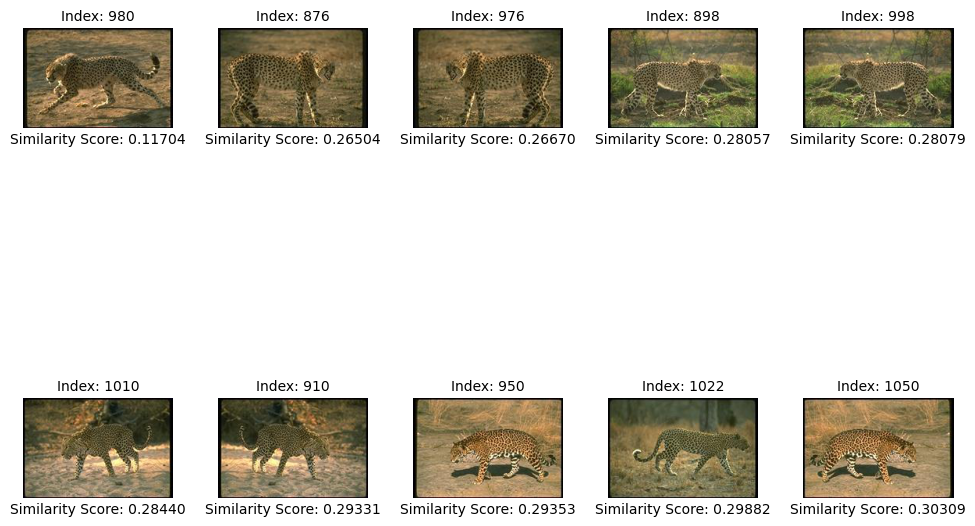

### ResNet-FC-1000 - Cosine Similarity

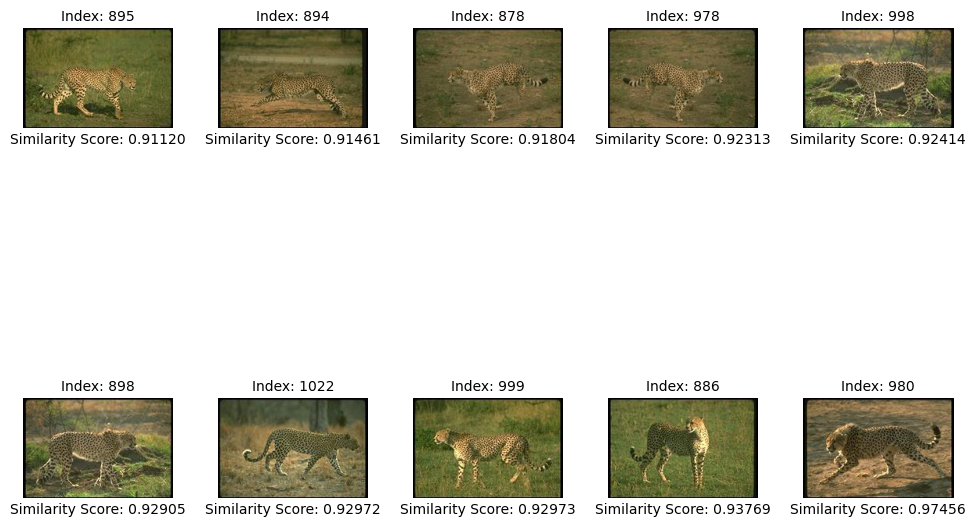

In [70]:
similarity_scores880 = queryksimilar(880,10)

  0%|          | 0/8677 [00:00<?, ?it/s]

### Query Image


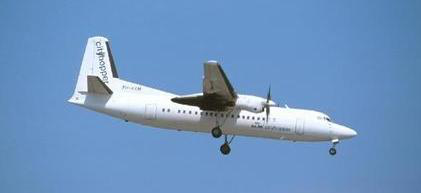

### Query Image Color Moments

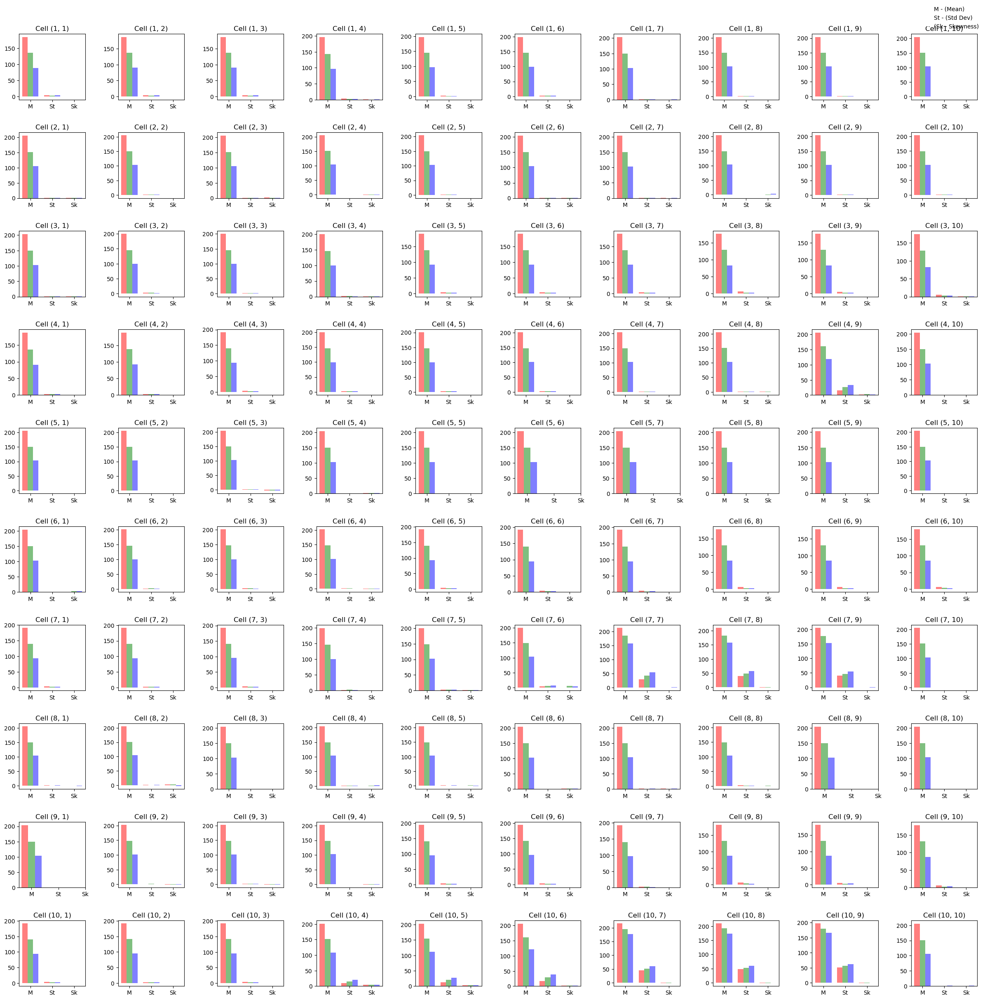

### Query Image HOG Descriptor

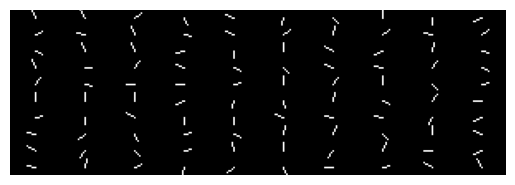

### Query Image Avgpool Descriptor

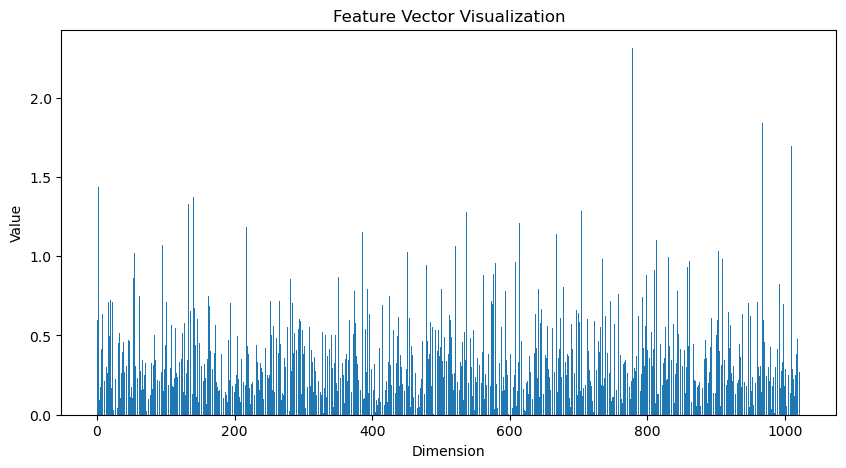

### Query Image Layer3 Descriptor

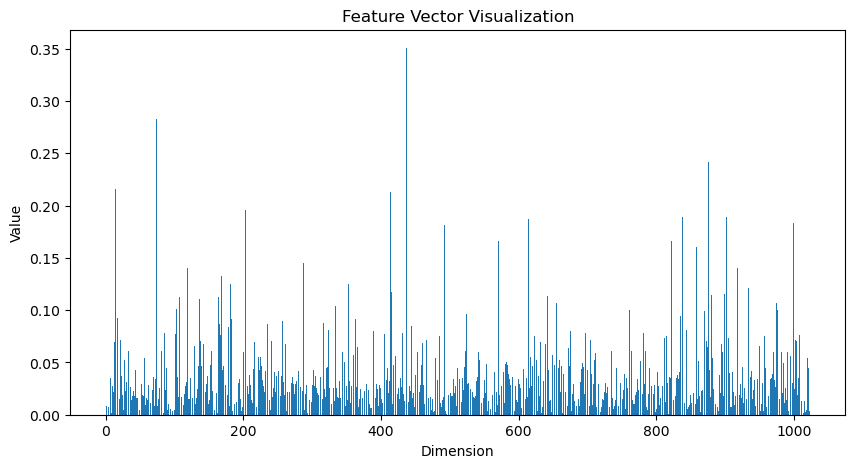

### Query Image FC Descriptor

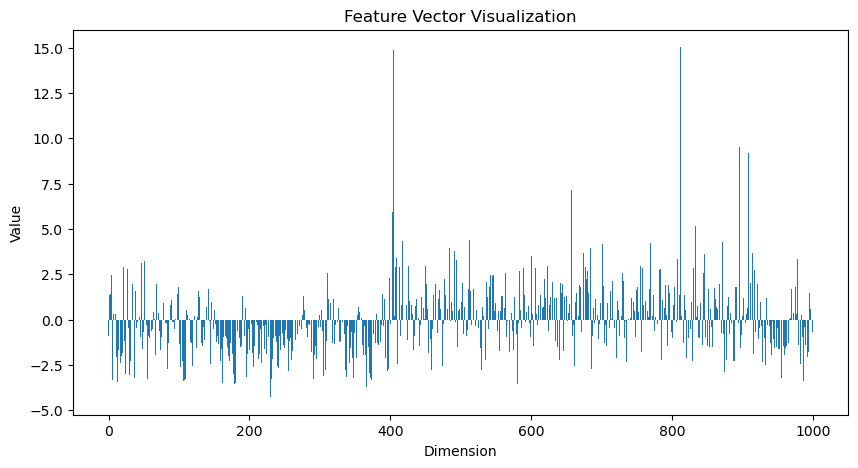

### Color Moments - Euclidean Distance

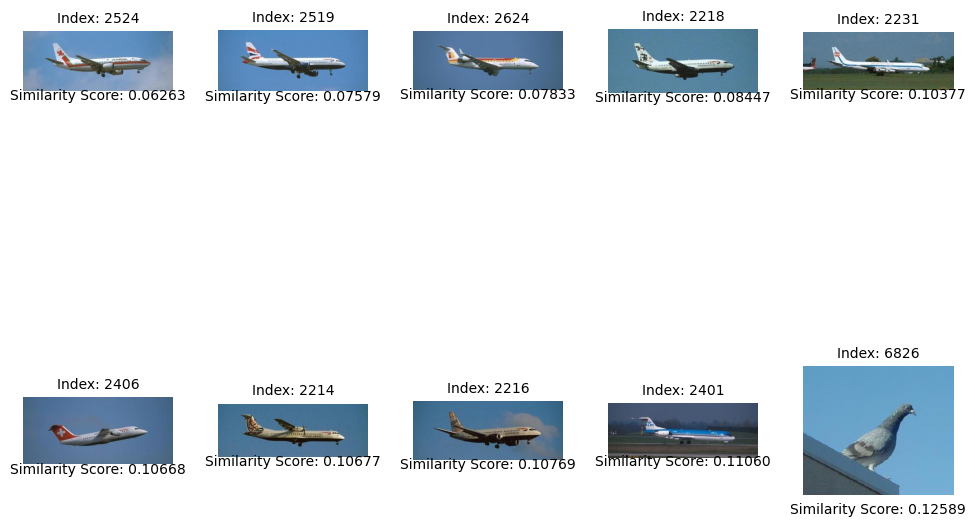

### Histograms of Oriented Gradients(HOG) - Cosine Similarity

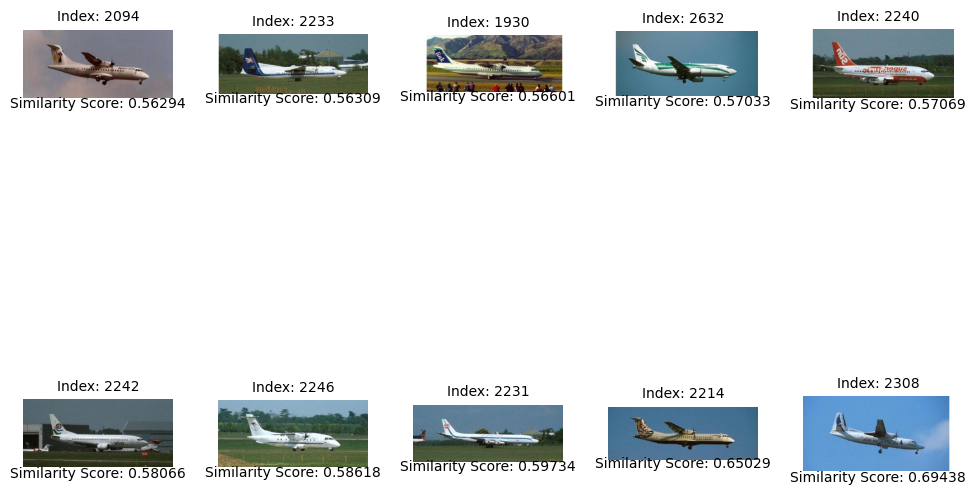

### ResNet-AvgPool-1024 - Cosine Similarity

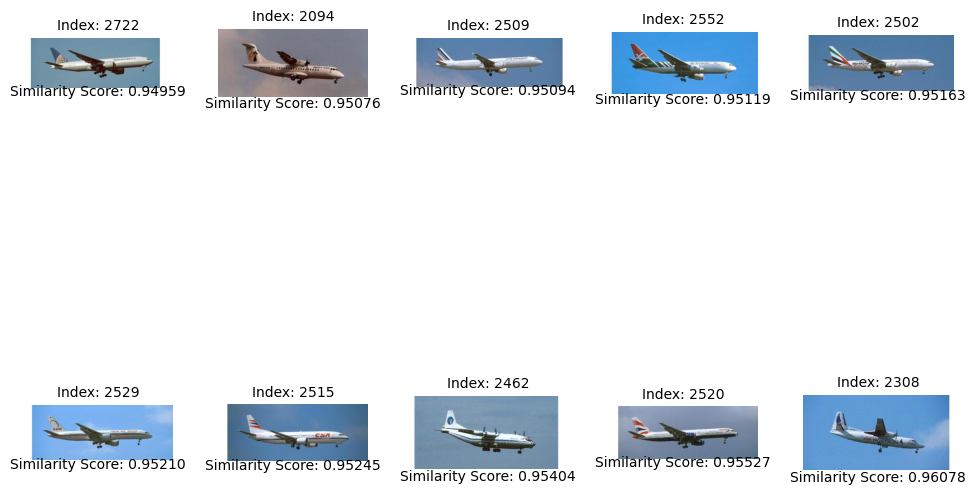

### ResNet-Layer3-1024 - Euclidean Distance

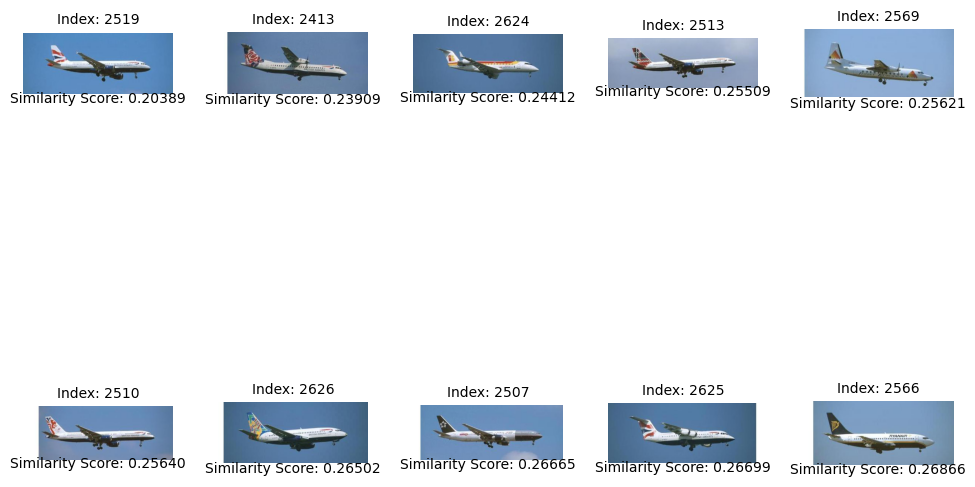

### ResNet-FC-1000 - Cosine Similarity

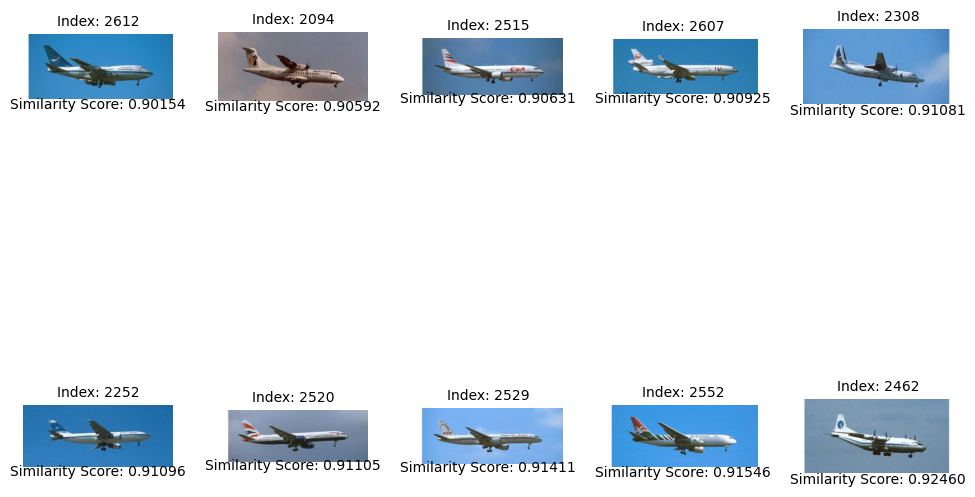

In [71]:
similarity_scores2500 = queryksimilar(2500,10)

  0%|          | 0/8677 [00:00<?, ?it/s]

### Query Image


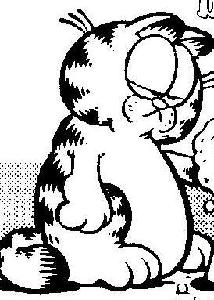

### Query Image Color Moments

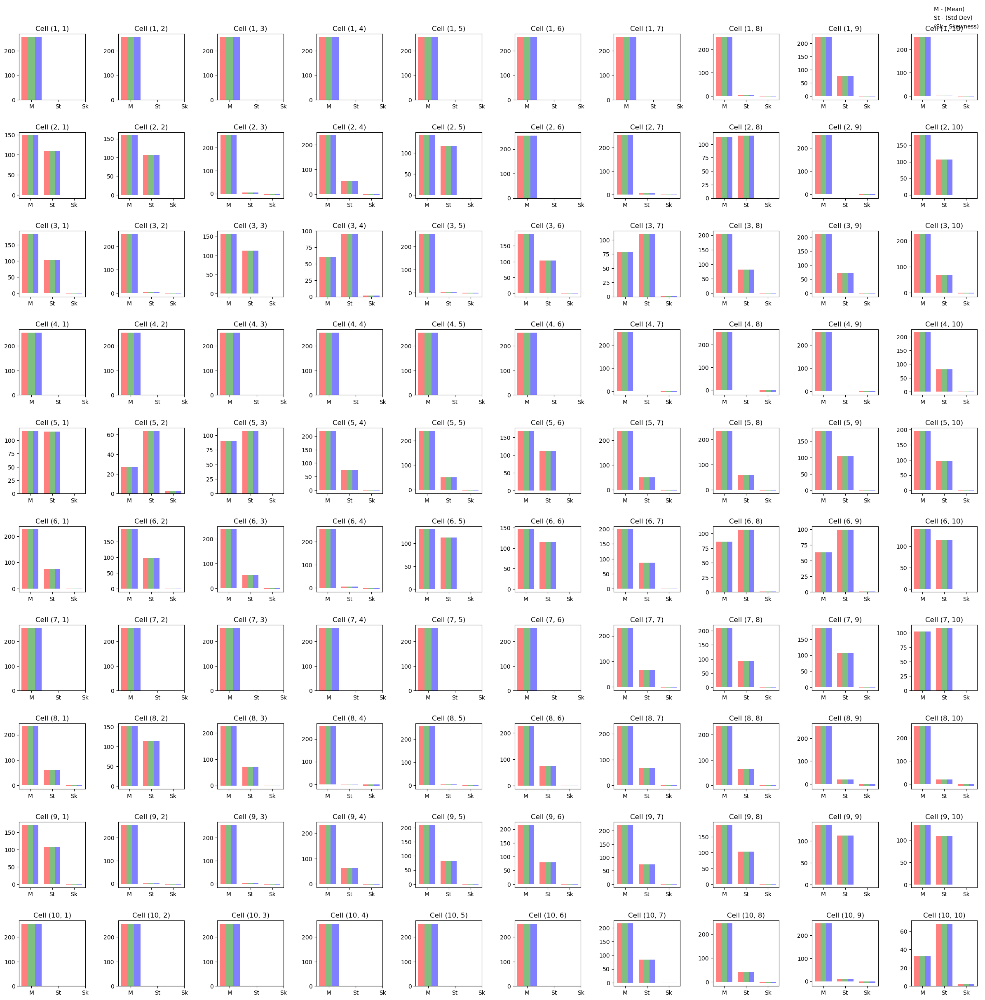

### Query Image HOG Descriptor

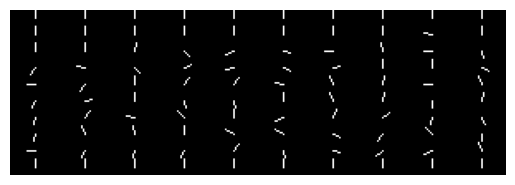

### Query Image Avgpool Descriptor

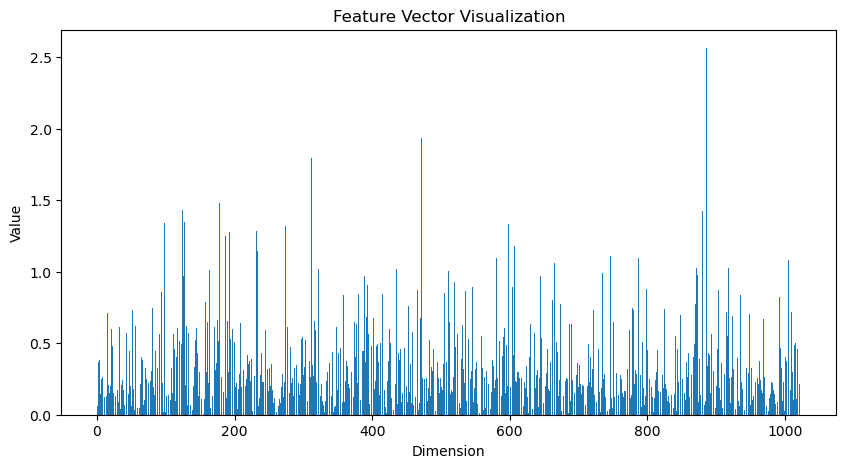

### Query Image Layer3 Descriptor

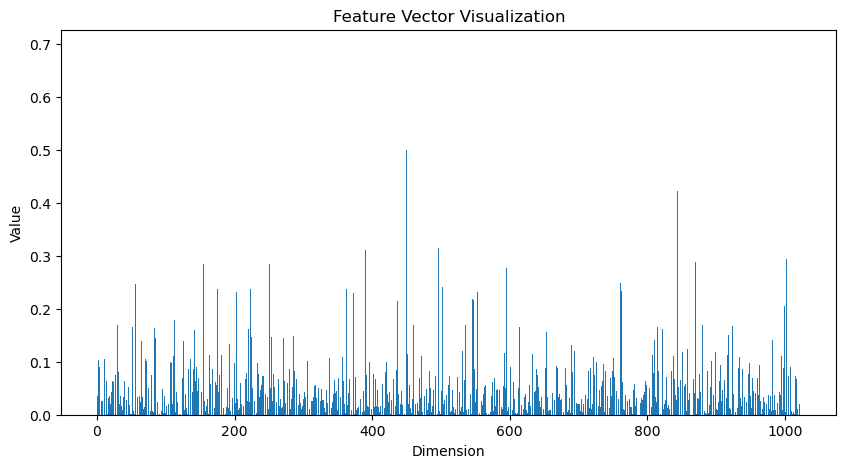

### Query Image FC Descriptor

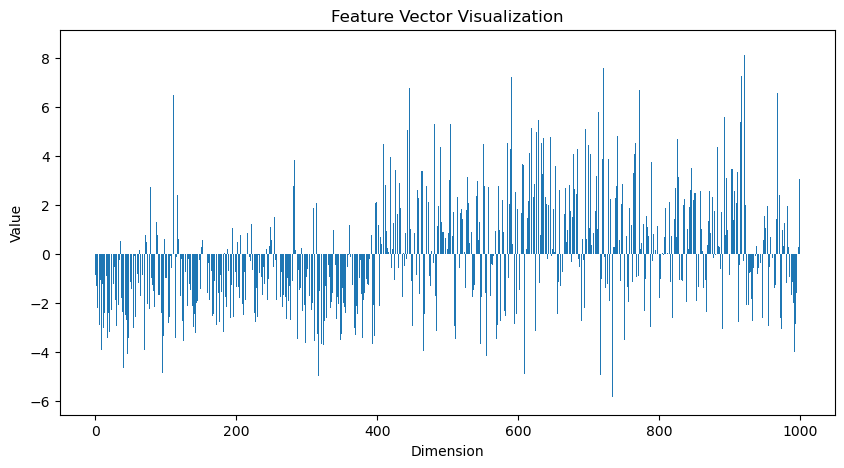

### Color Moments - Euclidean Distance

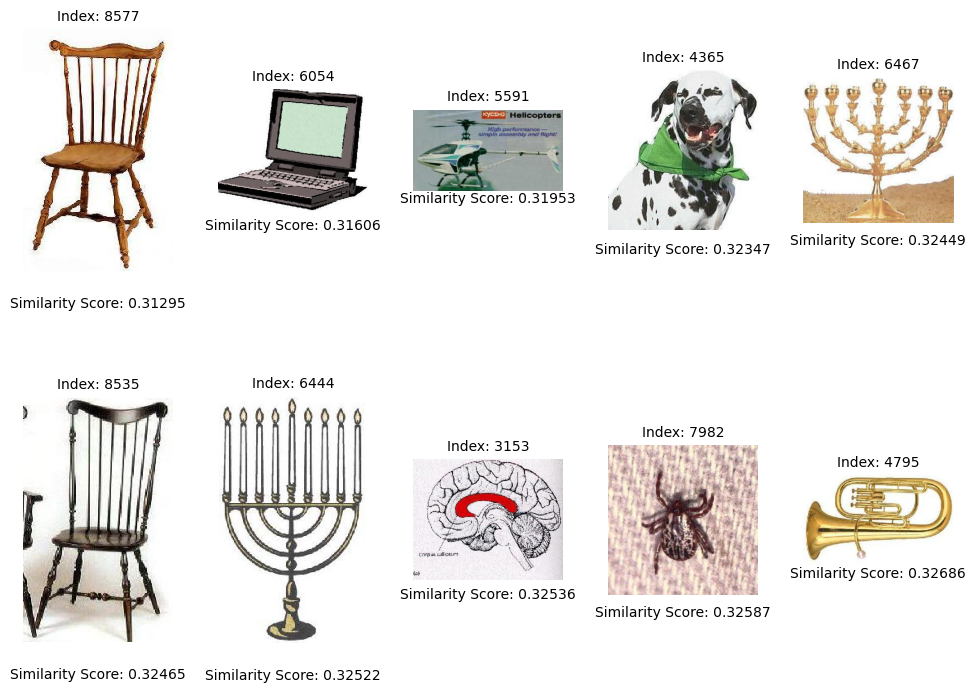

### Histograms of Oriented Gradients(HOG) - Cosine Similarity

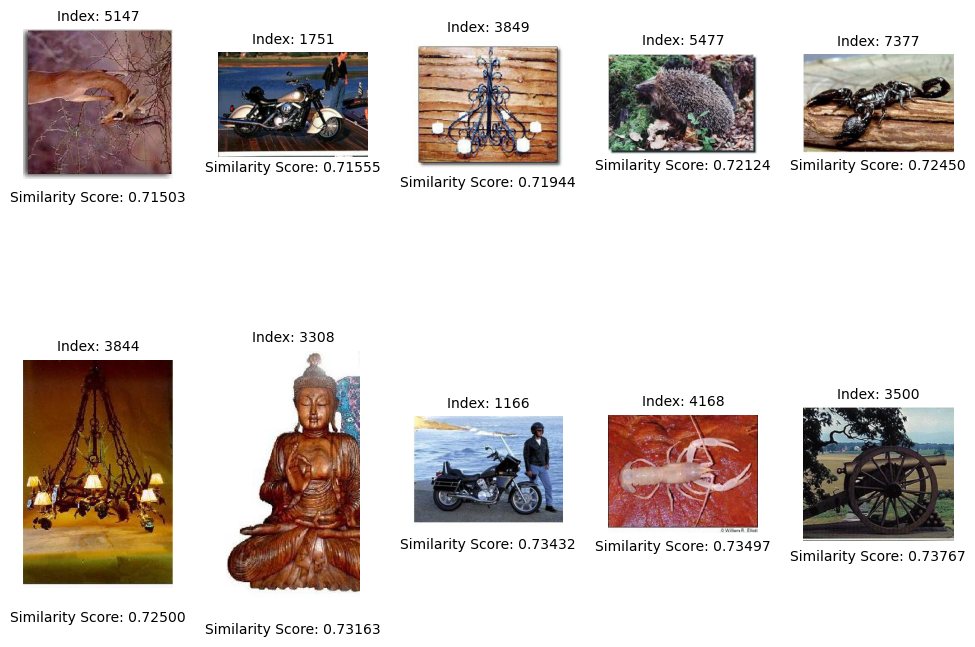

### ResNet-AvgPool-1024 - Cosine Similarity

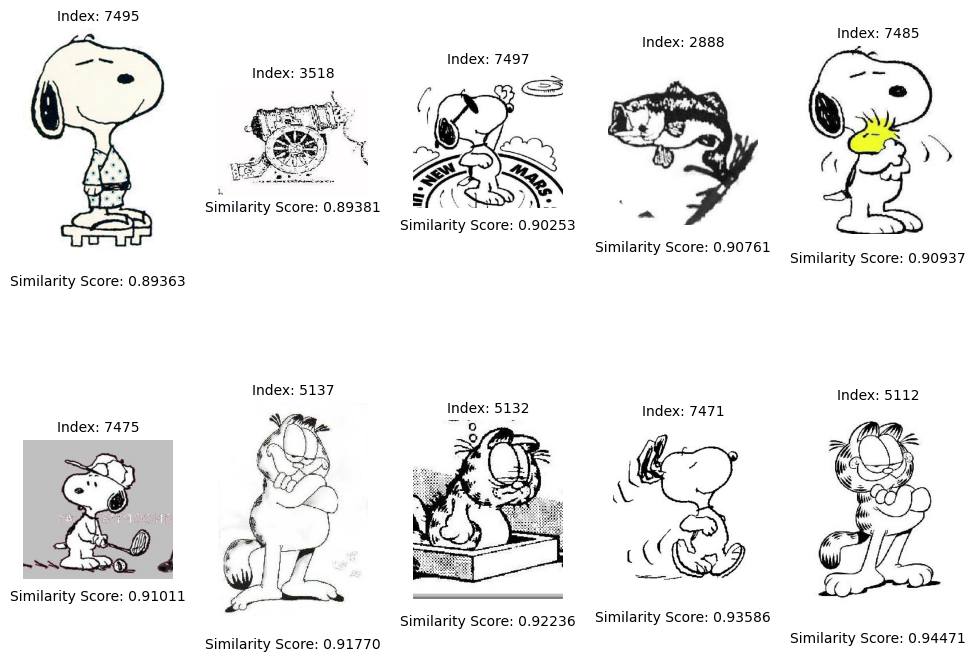

### ResNet-Layer3-1024 - Euclidean Distance

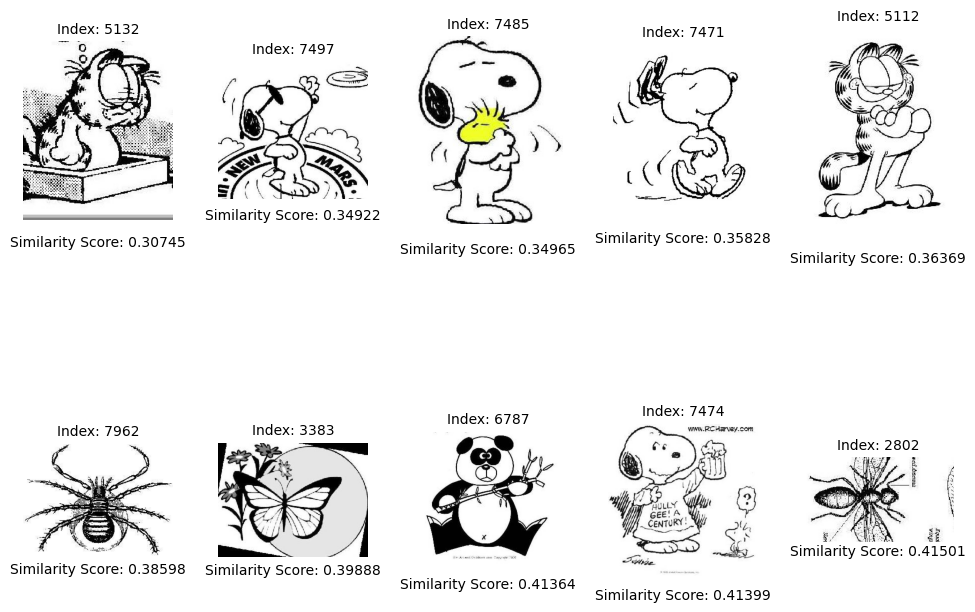

### ResNet-FC-1000 - Cosine Similarity

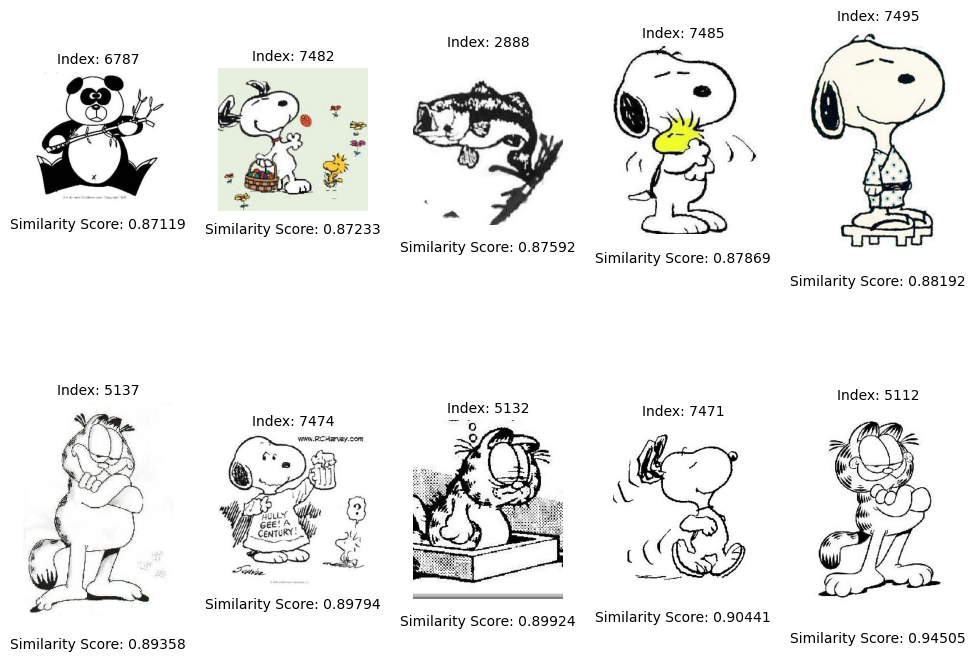

In [72]:
similarity_scores5122 = queryksimilar(5122,10)

  0%|          | 0/8677 [00:00<?, ?it/s]

### Query Image


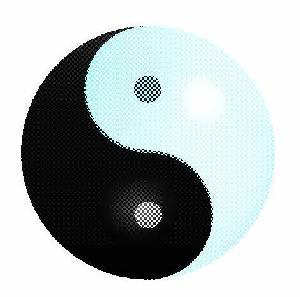

### Query Image Color Moments

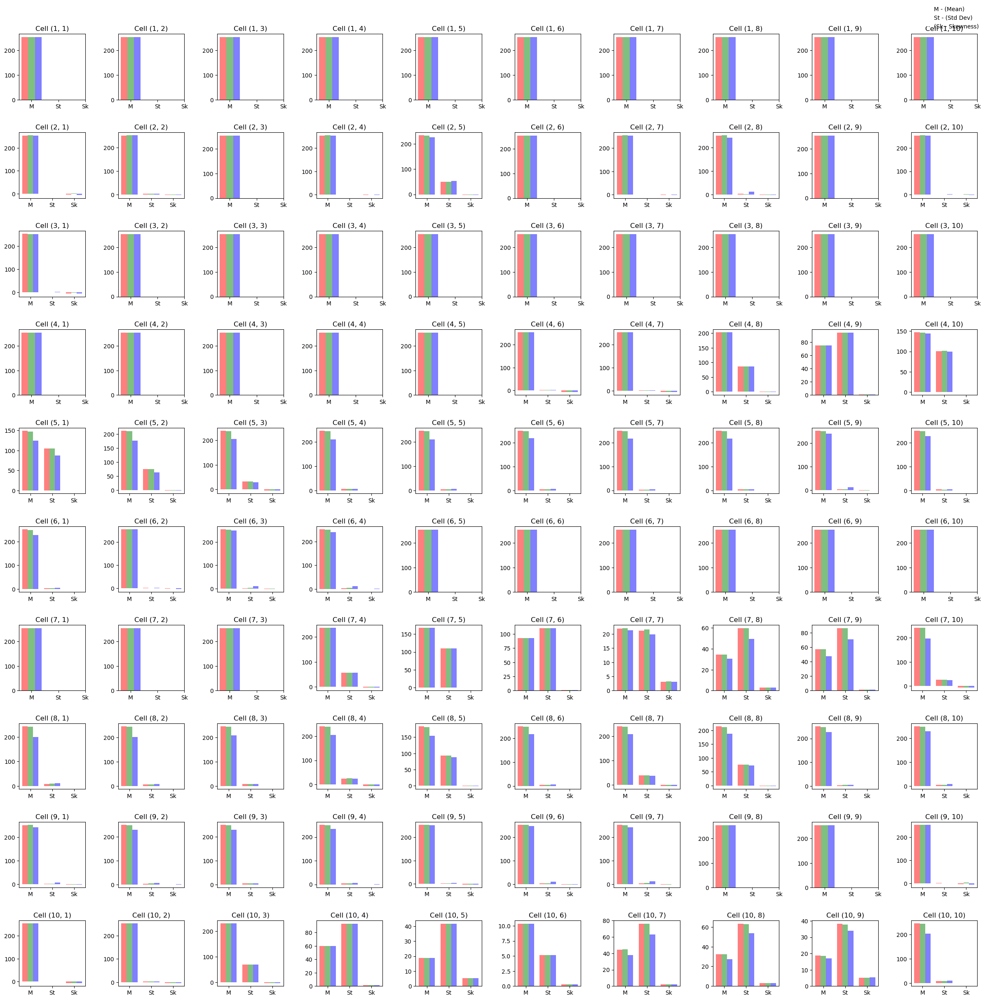

### Query Image HOG Descriptor

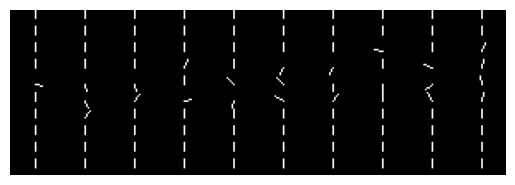

### Query Image Avgpool Descriptor

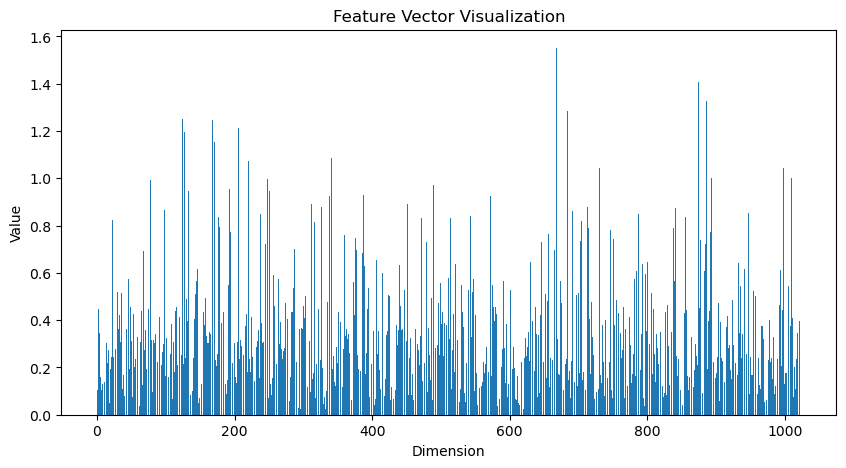

### Query Image Layer3 Descriptor

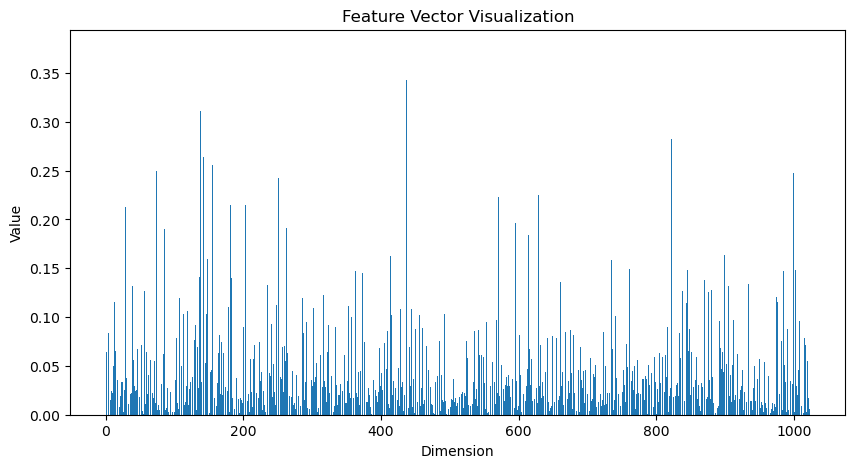

### Query Image FC Descriptor

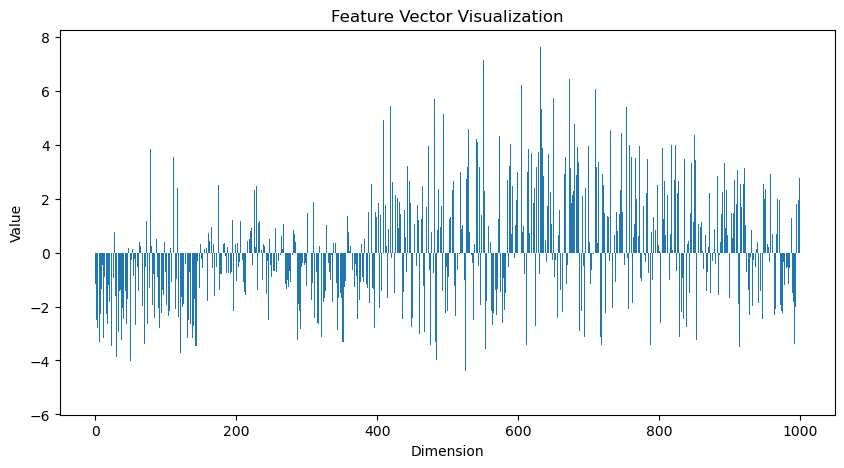

### Color Moments - Euclidean Distance

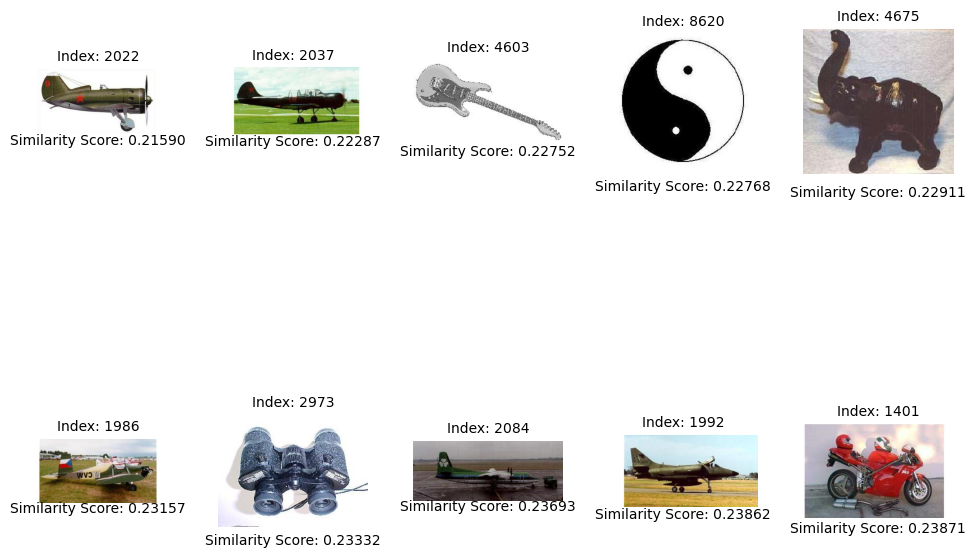

### Histograms of Oriented Gradients(HOG) - Cosine Similarity

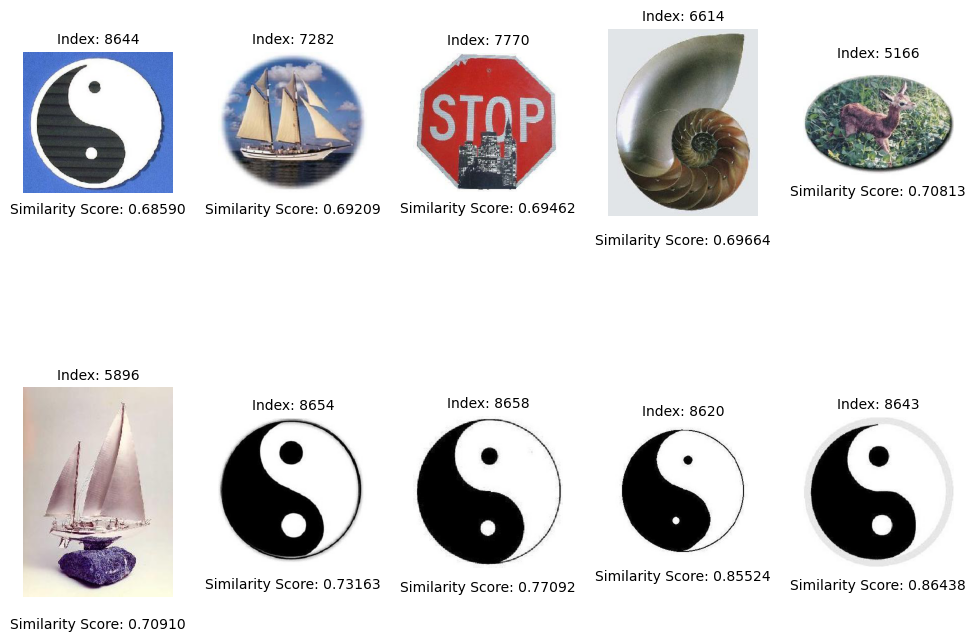

### ResNet-AvgPool-1024 - Cosine Similarity

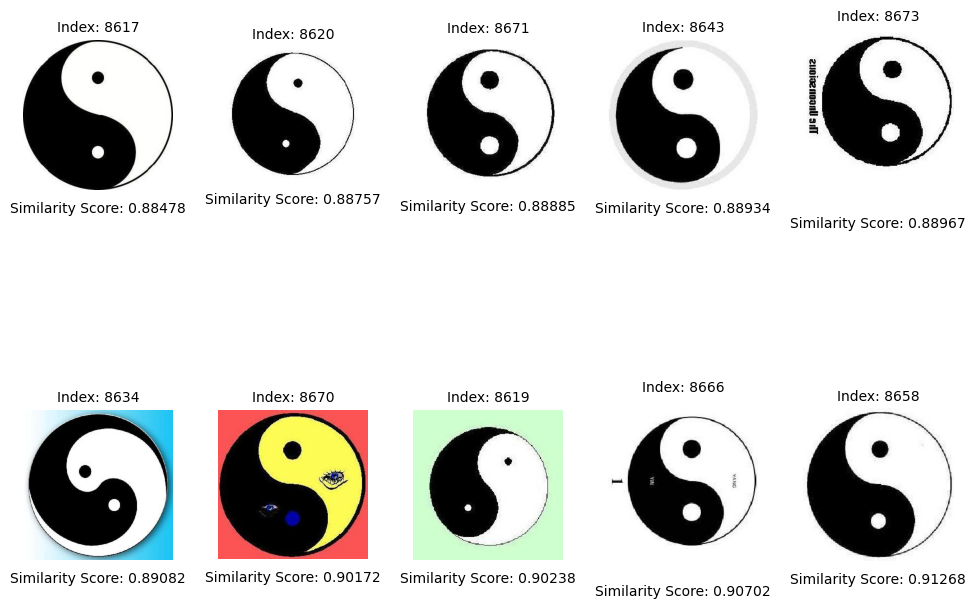

### ResNet-Layer3-1024 - Euclidean Distance

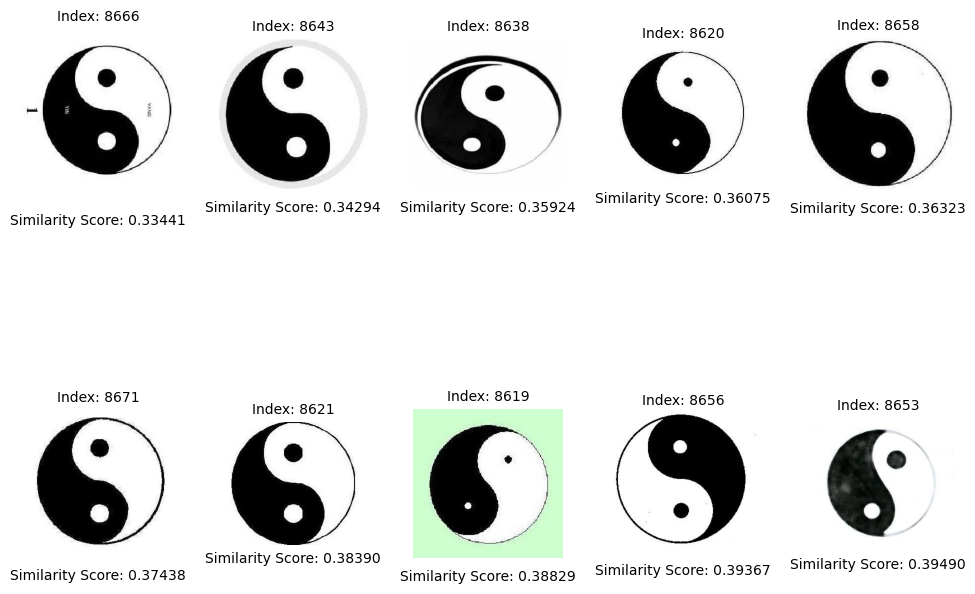

### ResNet-FC-1000 - Cosine Similarity

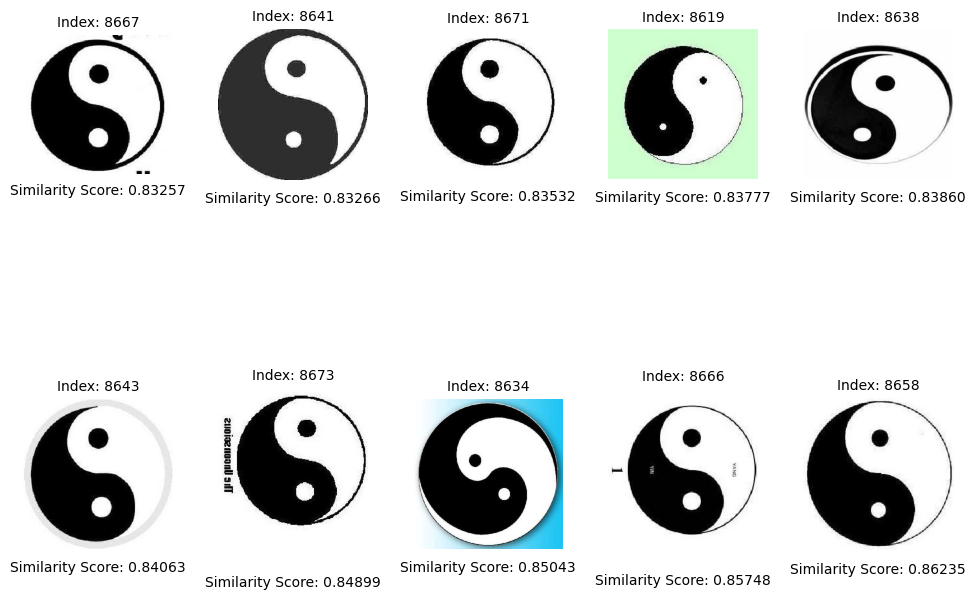

In [73]:
similarity_scores8676 = queryksimilar(8676,10)

## Interface for User Input

In [74]:
display(Markdown("## Get k Similar Images - Pass the value as ' ImageId , k '"))
text = widgets.Text(
    value='',
    placeholder=' ImageID , k ',
    description='',
    disabled=False
)
display(text)

def callback(wdgt):
    index = int(wdgt.value.split(',')[0].strip())
    k = int(wdgt.value.split(',')[1].strip())
    imagedata = collection.find_one({'_id': index})
    image = np.array(imagedata['image'], dtype=np.uint8)
    display(Markdown("### Query Image"))
    display_image_centered(np.array(image))
    display(Markdown("### Query Image Color Moments"))
    display_color_moments(np.array(imagedata['color_moments']))
    display(Markdown("### Query Image HOG Descriptor"))
    display_hog(imagedata['hog_descriptor'])
    display(Markdown("### Query Image Avgpool Descriptor"))
    display_feature_vector(imagedata['avgpool_descriptor'])
    display(Markdown("### Query Image Layer3 Descriptor"))
    display_feature_vector(imagedata['layer3_descriptor'])
    display(Markdown("### Query Image FC Descriptor"))
    display_feature_vector(imagedata['fc_descriptor'])
    queryksimilar(index, k)
    clear_output(wait=True)  # Clear the output after processing the input

text.on_submit(callback)

## Get k Similar Images - Pass the value as ' ImageId , k '

Text(value='', placeholder=' ImageID , k ')